In [18]:
#imports
import os
import numpy as np
import pandas as pd
import scipy.stats as stats
import re

#nilearn
from nilearn import plotting, image
import nilearn.connectome as nic

#plotting
import matplotlib.pyplot as plt

#hcp labels
import hcp_utils as hcp

#model
from sklearn.manifold import SpectralEmbedding
from sklearn.svm import SVC
from sklearn.svm import SVR
from sklearn.decomposition import PCA

#splitting into training and test
from imblearn.combine import SMOTEENN
from imblearn.over_sampling import SMOTENC
from sklearn.model_selection import train_test_split

#Assement of the model
from sklearn.metrics import confusion_matrix
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import mean_squared_error

from load_data import *

In [2]:
blue = '#6096BA'
purple = '#642CA9'

## Loading the Data

In [3]:
# read in 172 relevant subjects
sub_id = np.load('sub_ids.npy')

In [4]:
#import ICA data
ica_data, sub_id = load_txt(n=300, sub_id=sub_id)

Subject Data Loaded


In [5]:
atlas = load_atlas(n=300)
atlas_coords = get_atlas_coords(atlas)

/home/anmarkova/private/Public-DSC180B-Functional-Connectivity-Project/load_data.py:60: FutureWarning: From release 0.13.0 onwards, this function will, by default, copy the header of the input image to the output. Currently, the header is reset to the default Nifti1Header. To suppress this warning and use the new behavior, set `copy_header=True`.
  atlas = image.threshold_img(atlas, "99.5%")


atlas has shape ['x', 'y', 'z', 'region'] = (91, 109, 91, 300)


In [6]:
df = pd.read_csv('/home/anmarkova/teams/a05/group_2/handedness_data.csv')
df = df.set_index('Subject').loc[sub_id].reset_index()

In [7]:
#check that the order of subjects is the same
df['Subject'].to_list() == list(sub_id)

True

In [8]:
df.loc[df['Handedness'] < 0, ['hand_class']] = 'Left'
df.loc[df['Handedness'] > 0, ['hand_class']] = 'Right'
df.loc[df['Handedness'] == 0, ['hand_class']] = 'Both'

In [9]:
#create an array of handedness
handedness = df['Handedness'].to_numpy()

In [10]:
#region labels
# region_labels = get_labels(atlas_coords)

In [11]:
ica_data.shape

(165, 4800, 300)

## EDA

### Handedness

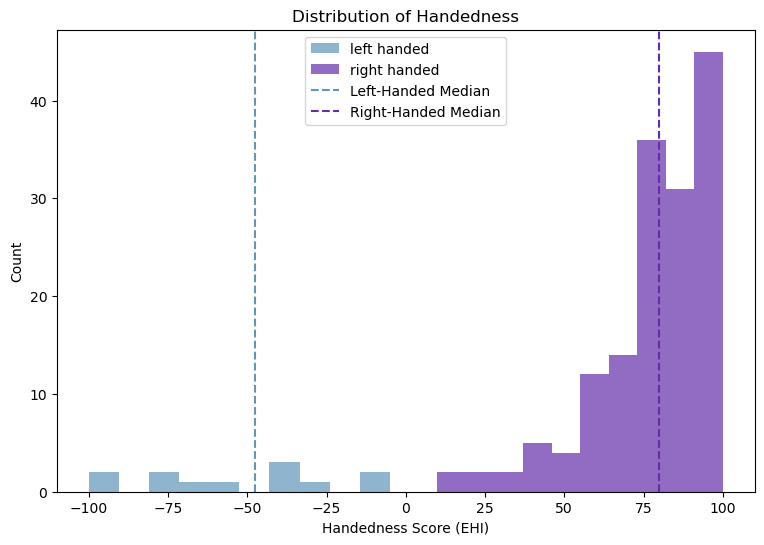

In [12]:
left_handed = df[df['Handedness'] < 0] 
right_handed = df[df['Handedness'] > 0]

fig, ax = plt.subplots(figsize = (9, 6))

#plot distributions
plt.hist(left_handed["Handedness"], color=blue, label='left handed', alpha=0.7)
plt.hist(right_handed["Handedness"], color=purple, label='right handed', alpha=0.7)

#plot medians
plt.axvline(left_handed['Handedness'].median(), color=blue, linestyle='--', label='Left-Handed Median')
plt.axvline(right_handed['Handedness'].median(), color=purple, linestyle='--', label='Right-Handed Median')

#add annotations
ax.set_title('Distribution of Handedness')
plt.ylabel('Count')
plt.xlabel('Handedness Score (EHI)')
plt.legend()

In [13]:
df.groupby('hand_class').describe()

Subject                                                     \
             count           mean            std       min        25%   
hand_class                                                              
Left          12.0  402609.583333  305957.607423  125525.0  198620.75   
Right        153.0  379492.516340  280893.277654  100610.0  164131.00   

                                          Handedness                        \
                 50%        75%       max      count       mean        std   
hand_class                                                                   
Left        232235.5  640802.25  899885.0       12.0 -52.500000  32.856437   
Right       209228.0  617748.00  971160.0      153.0  79.542484  19.570718   

                                              
              min    25%   50%    75%    max  
hand_class                                    
Left       -100.0 -76.25 -47.5 -33.75   -5.0  
Right        10.0  70.00  80.0  95.00  100.0

### Brains

Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7fc1e9828d70>>
Traceback (most recent call last):
  File "/home/anmarkova/.conda/envs/capstone/lib/python3.13/site-packages/ipykernel/ipkernel.py", line 775, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 
Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7fc1e9828d70>>
Traceback (most recent call last):
  File "/home/anmarkova/.conda/envs/capstone/lib/python3.13/site-packages/ipykernel/ipkernel.py", line 775, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 
Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7fc1e9828d70>>
Traceback (most recent call last):
  File "/home/anmarkova/.conda/envs/capstone/lib/python3.13/site-packages/ipy

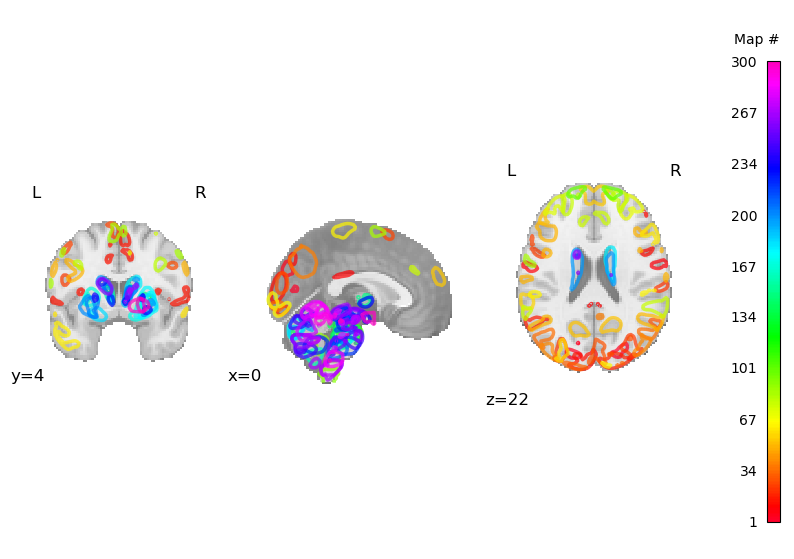

In [14]:
# plot atlas, all regions
fig, axs = plt.subplots(nrows=1, figsize=(10, 7))
plotting.plot_prob_atlas(atlas, colorbar=True, draw_cross=False, axes=axs)

In [16]:
fig.savefig('img/d300_brain_map.png', dpi=300)

In [16]:
ica_data.shape

#165 - subjects
#4800 - data points
#300 - brain regions (359 per hemisphere)

(165, 4800, 300)

## Constructing Correlation Matrices

In [17]:
#Correlation matrix
correlation_measure = nic.ConnectivityMeasure(kind='partial correlation')
correlation_matrix = correlation_measure.fit_transform(ica_data)

In [64]:
#replace 1.0 with np.nan for fisher's z transform
copy_matrix = correlation_matrix.copy()
copy_matrix[copy_matrix == 1.00] = np.nan

fisher_z_matrices = np.arctanh(copy_matrix)

Text(0.5, 1.0, 'Mean Correlation Matrix (ICA Matched data)')

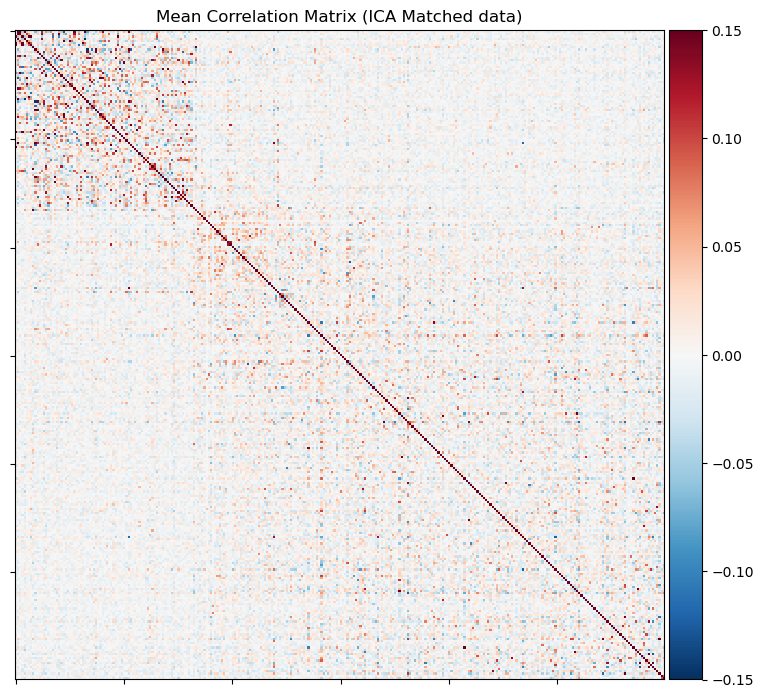

In [55]:
#average matrix
fig, ax = plt.subplots(figsize=(7, 7),
                       layout='constrained')
plotting.plot_matrix(
    correlation_measure.mean_, colorbar=True, vmax=0.15, vmin=-0.15, figure=fig
)
ax.set_title('Mean Correlation Matrix (ICA Matched data)')

In [16]:
fig.savefig('img/meancorrelationICA_matched.png', dpi=300)

Text(0.5, 1.0, 'Mean Correlation Matrix (ICA Matched data)')

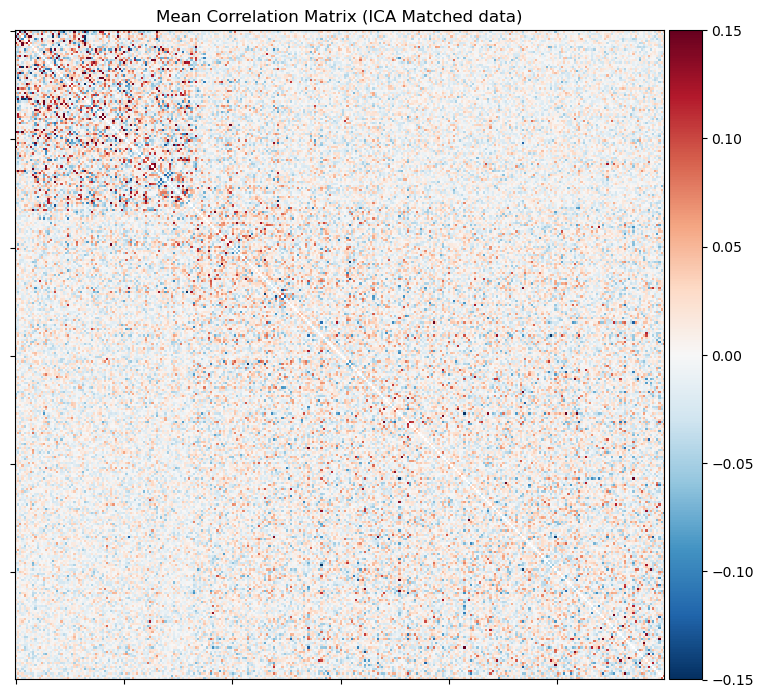

In [17]:
#example matrix
fig, ax = plt.subplots(figsize=(7, 7),
                       layout='constrained')
plotting.plot_matrix(
    fisher_z_matrices[0], colorbar=True, vmax=0.15, vmin=-0.15, figure=fig
)
ax.set_title('Mean Correlation Matrix (ICA Matched data)')

In [20]:
#function that identifies whether a correlation is statistically significant
def calc_corr(fisher_z_matrices):
    corr_mat = {}
    pval_mat = {}
    count_pval = 0
    matrix_dim = fisher_z_matrices.shape
    for i in range(matrix_dim[1]):
        for j in range(i, matrix_dim[1]):
            if i != j:
                corr, pval = stats.pearsonr(fisher_z_matrices[:,i, j],  handedness)
                corr_mat[(i, j)] = corr
                pval_mat[(i,j)] = pval
    return corr_mat, pval_mat

In [21]:
#all significant correlations
corr_mat, pval_mat = calc_corr(fisher_z_matrices)
corr_sig = np.array(list(corr_mat.values()))

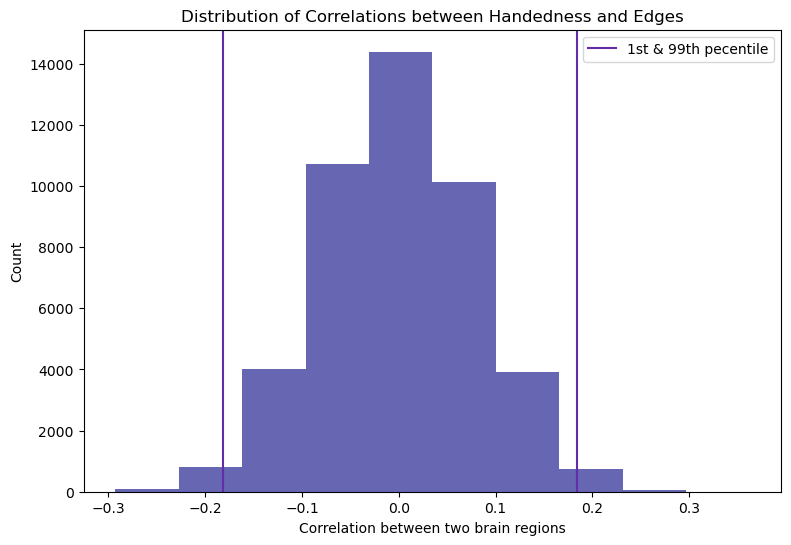

In [190]:
fig, ax = plt.subplots(figsize = (9, 6))
ax.hist(corr_sig, color='navy', alpha=0.6)
bottom_5, top_5 = np.percentile(corr_sig, [1, 99])
ax.axvline(bottom_5, color=purple)
ax.axvline(top_5, color = purple, label='1st & 99th pecentile')
ax.set_title('Distribution of Correlations between Handedness and Edges')
plt.xlabel("Correlation between two brain regions")
plt.ylabel("Count")
plt.legend()
plt.show()

In [191]:
fig.savefig('report/matched_ica_corr_dist.png')

In [23]:
sorted_keys = sorted(corr_mat, key=lambda x: corr_mat[x])
for i in sorted_keys[:5]:
    print(f'For key {i} the correlation is {corr_mat[i]}')

print('---')
for i in sorted_keys[-5:]:
    print(f'For key {i} the correlation is {corr_mat[i]}')

For key (224, 256) the correlation is -0.2928979851430596
For key (29, 225) the correlation is -0.28813399572409865
For key (136, 258) the correlation is -0.2872006898189785
For key (148, 164) the correlation is -0.2774653076823982
For key (35, 264) the correlation is -0.27696907506428425
---
For key (55, 196) the correlation is 0.2902475333816083
For key (63, 153) the correlation is 0.29339760387569214
For key (77, 228) the correlation is 0.3057860766360073
For key (125, 263) the correlation is 0.312663510185198
For key (9, 222) the correlation is 0.3623704171233191


NameError: name 'region_labels' is not defined

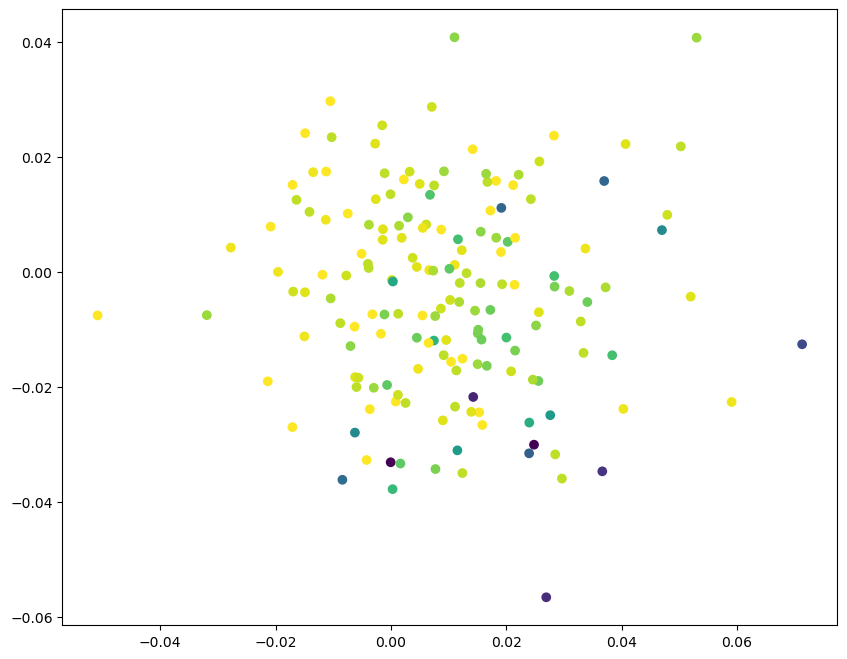

In [24]:
idx1 = 0
idx2 = -1

# Create the scatter plot
fig, ax = plt.subplots(figsize = (10, 8))

sc = ax.scatter(fisher_z_matrices[:, sorted_keys[idx1][0], sorted_keys[idx1][1]], 
                 fisher_z_matrices[:, sorted_keys[idx2][0], sorted_keys[idx2][1]], 
                 c=handedness, cmap='viridis')  
plt.xlabel(f'Correlation between {region_labels[sorted_keys[idx1][0]]} and {region_labels[sorted_keys[idx1][1]]}')
plt.ylabel(f'Correlation between {region_labels[sorted_keys[idx2][0]]} and {region_labels[sorted_keys[idx2][1]]}')

ax.set_title('Handedness across edge correlations')

# Add a colorbar
cbar = plt.colorbar(sc)
cbar.set_label('Handedness')  # Label the colorbar


# Show the plot
plt.show()


## Spectral Embedding

In [25]:
def select_edges(num):
    # get indeces transform top 10 strongest correlations 
    indx = [list(i) for i in sorted_keys[:num] + sorted_keys[-num:]]
    indx = np.array(indx).T
    # extract correlation of highest correlated region for every subject
    X = fisher_z_matrices[:, indx[0], indx[1]]
    return X

In [26]:
def plot_spectral_embedding(X_transformed):
    fig, ax = plt.subplots(figsize = (10, 8))

    #create scatter plot
    sc = ax.scatter(X_transformed[:, 0], X_transformed[:, 1], c=handedness, cmap='viridis')
    
    ax.set_title(f'Spectral Embedding of the Top {num*2} Edges Correlated with Handedness')
    
    # Add a colorbar
    cbar = plt.colorbar(sc)
    cbar.set_label('Handedness')  # Label the colorbar
    plt.show()


In [22]:
# Look if the data is separable with dimensionality reduction
nums = np.arange(5, 51, 10)
for num in nums:
    X = select_edges(num)
    #using nearesst neighbors as the distance function
    embedding = SpectralEmbedding(n_components=2)
    X_transformed = embedding.fit_transform(X)
    # X_transformed.shape
    plot_spectral_embedding(X_transformed)


NameError: name 'sorted_keys' is not defined

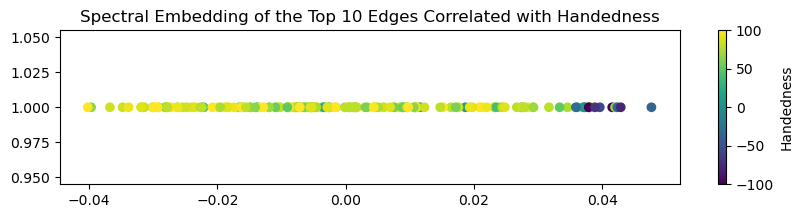

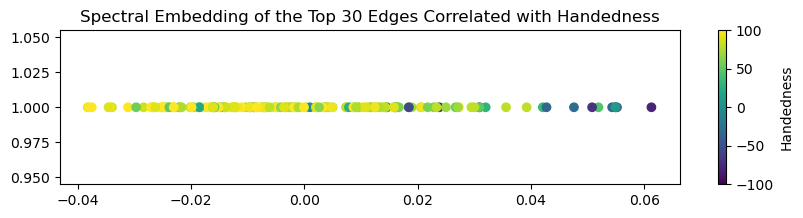

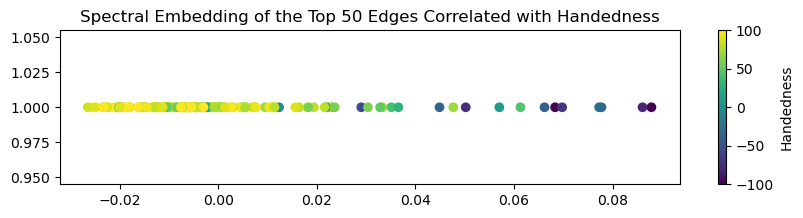

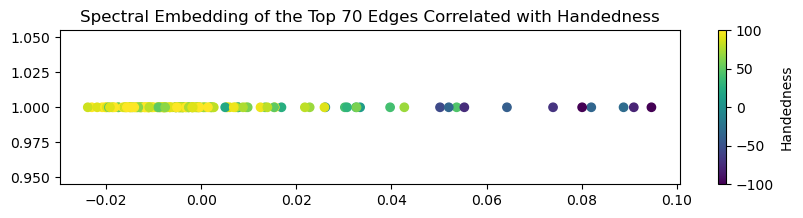

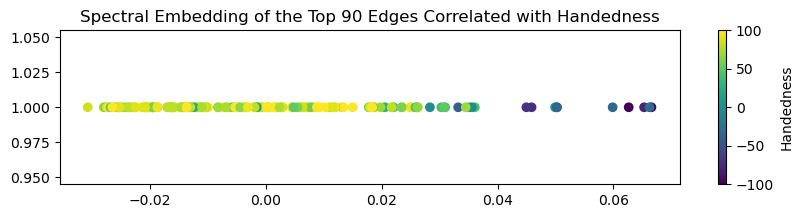

In [31]:
# Look if the data is separable with dimensionality reduction
nums = np.arange(5, 51, 10)
for num in nums:
    X = select_edges(num)
    #using nearesst neighbors as the distance function
    embedding = SpectralEmbedding(n_components=1)
    X_transformed = embedding.fit_transform(X)
    # X_transformed.shape
    fig, ax = plt.subplots(figsize = (10, 2))
    
    #create scatter plot
    sc = ax.scatter(X_transformed[:, 0], [1]*165, c=handedness, cmap='viridis')
    
    ax.set_title(f'Spectral Embedding of the Top {num*2} Edges Correlated with Handedness')
    
    # Add a colorbar
    cbar = plt.colorbar(sc)
    cbar.set_label('Handedness')  # Label the colorbar
    plt.show()

## Trivial Predictor

In [28]:
#converting handedness to a class
# 1 - right handed
# 0 - left handed
handedness_class = (handedness > 0).astype(int)

In [33]:
#always select right hand
class trivial():

    def __init__(self):
        self.X = None
        self.y = None
        
    def fit(self, X, y):
        assert type(X) == np.ndarray
        assert type(y) == np.ndarray
        self.X = X
        self.y = y

    def predict(self, X):
        if self.y is None:
            raise ValueError("Need to fit the model first") 
        return [stats.mode(self.y)[0]] * len(X)

In [34]:
avg_acc = 0
for i in range(100):
    X_train, X_test, y_train, y_test = train_test_split(correlation_matrix.reshape([165, -1]), handedness_class) #random_state=0
    
    #create an Trivial Mode
    mod =  trivial()
    mod.fit(X_train, y_train)
    
    y_pred = mod.predict(X_test)
    
    avg_acc += balanced_accuracy_score(y_test, y_pred)

avg_acc/100

/home/anmarkova/.conda/envs/capstone/lib/python3.13/site-packages/sklearn/metrics/_classification.py:407: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/anmarkova/.conda/envs/capstone/lib/python3.13/site-packages/sklearn/metrics/_classification.py:407: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


np.float64(0.51)

## Classification with SMV

Kernel - Sigmoid

$K(x,y)=tanh(α⋅x^Ty+c)$

where the kernel coefficient $α$ controls the influence of each individual training sample on the decision boundary and is the bias term $c$ that shifts the data up or down.

In the sigmoid kernel, the similarity between two data points is computed using the hyperbolic tangent function ($tanh$). The kernel function scales and possibly shifts the dot product of the two point ($x$ and $y$).

In [29]:
np.random.seed(0)
random_states = np.random.randint(0, 1000, 500)

In [43]:
nums = np.arange(2, 51, 2)
balanced_acc = []
for num in nums:
    print(num)
    for i in range(500):
        X = select_edges(num)
    
        #balance the dataset through oversampling
        sme = SMOTEENN(random_state=random_states[i]) #random_state=40
        X_res, y_res = sme.fit_resample(X, handedness_class)
        
        # Split into a train and test sets
        X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, random_state=random_states[i]) #random_state=0
    
        #create an SVM Model
        clf =  SVC(kernel='sigmoid')
        clf.fit(X_train, y_train)
    
        y_pred = clf.predict(X_test)
    
        point = [num*2, balanced_accuracy_score(y_test, y_pred)]
        balanced_acc.append(point)

2
4
6
8
10
12
14
16
18
20
22
24
26
28
30
32
34
36
38
40
42
44
46
48
50


Balanced Accuracy is the average of recall obtained on each class

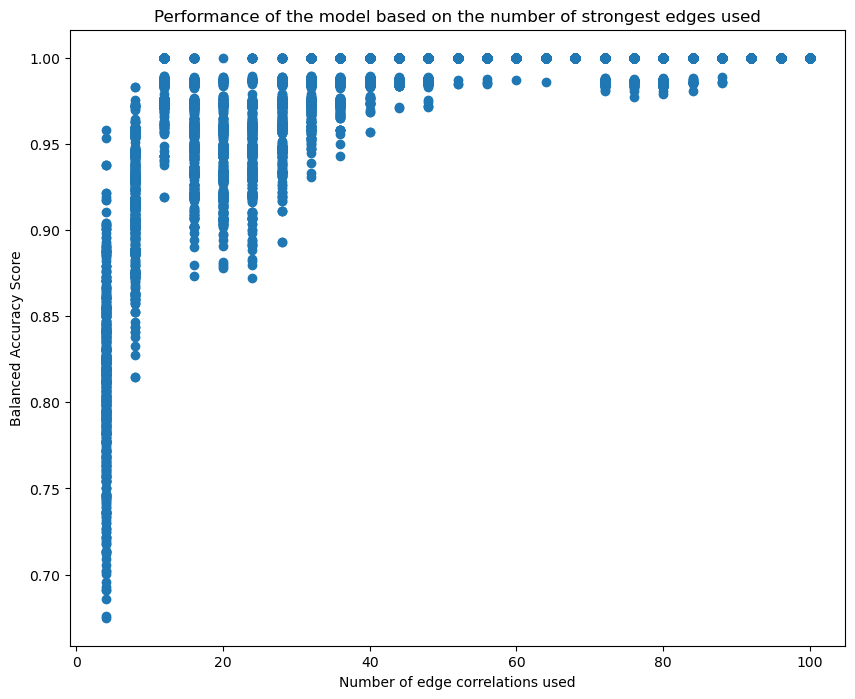

In [44]:
balanced_acc = np.array(balanced_acc) # Balanced Accuracy is the average of recall obtained on each class

fig, ax = plt.subplots(figsize = (10, 8))

#create scatter plot
sc = ax.scatter(balanced_acc[:, 0], balanced_acc[:, 1])

ax.set_title(f'Performance of the model based on the number of strongest edges used')

plt.xlabel('Number of edge correlations used')
plt.ylabel('Balanced Accuracy Score')

plt.show()


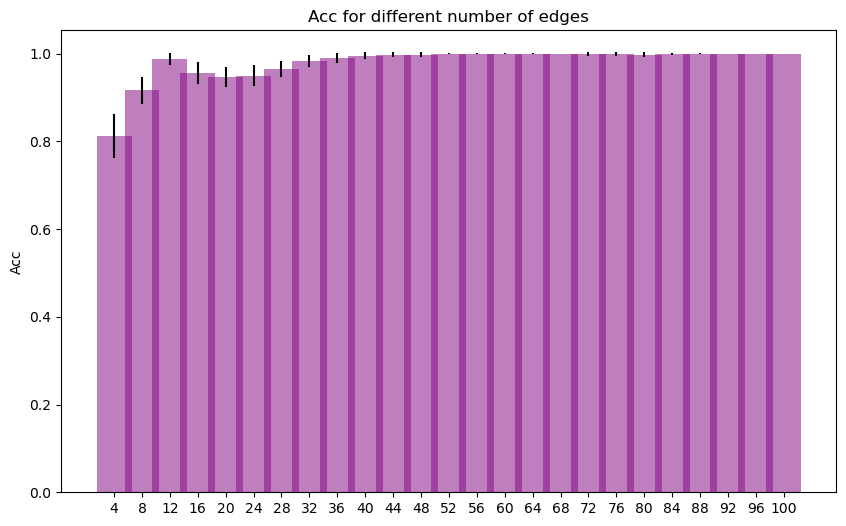

In [45]:

# Provided data
data = balanced_acc

# Convert to DataFrame
results = pd.DataFrame(data, columns=["Edges_Num", "Acc"])
results_f = results[(results['Edges_Num'] == 10) | (results['Edges_Num'] == 20) | (results['Edges_Num'] == 30) | (results['Edges_Num'] == 40) |(results['Edges_Num'] == 50) \
| (results['Edges_Num'] == 60) | (results['Edges_Num'] == 70) | (results['Edges_Num'] == 80) | (results['Edges_Num'] == 90) | (results['Edges_Num'] == 100)]

# Group by year and compute mean & standard deviation
grouped = results.groupby("Edges_Num")["Acc"]
mean_values = grouped.mean()
std_values = grouped.std()

# Plotting
fig, ax = plt.subplots(figsize = (10, 6))
colors = ["purple"] #red", "green", "blue"
plt.bar(mean_values.index, mean_values, yerr=std_values, align='center', alpha=0.5, color=colors[:len(mean_values)], width=5)

plt.xticks(mean_values.index)
plt.ylabel("Acc")
plt.title("Acc for different number of edges")
plt.show()

In [46]:
np.save('balanced_acc_matched.npy', balanced_acc)

In [47]:
mean_acc = results.groupby('Edges_Num')['Acc'].mean()
mean_acc.iloc[[mean_acc.argmax()]]

Edges_Num
68.0    1.0
Name: Acc, dtype: float64

In [30]:
# 30 seems like a good number of edges
X = select_edges(150) #take top 150 and bottom 150 strongest

balanced_acc = []
confusion_mat = []
for i in range(500):    
    #balance the dataset through oversampling
    sme = SMOTEENN(random_state=random_states[i]) #random_state=82
    X_res, y_res = sme.fit_resample(X, handedness_class)
    
    # Split into a train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, random_state=random_states[i]) # random_state=0
    
    #create an SVM Model
    clf =  SVC(kernel='sigmoid')
    clf.fit(X_train, y_train)
    
    y_pred = clf.predict(X_test)

    confusion_mat.append(confusion_matrix(y_test, y_pred))
    balanced_acc.append(balanced_accuracy_score(y_test, y_pred))
    
    # print(confusion_matrix(y_test, y_pred))
    # print(balanced_accuracy_score(y_test, y_pred))

In [31]:
#find the average
confusion_mat = np.array(confusion_mat)
balanced_acc = np.array(balanced_acc)

print(np.mean(balanced_acc))
print(np.mean(confusion_mat, axis=0))

1.0
[[38.542  0.   ]
 [ 0.    34.724]]


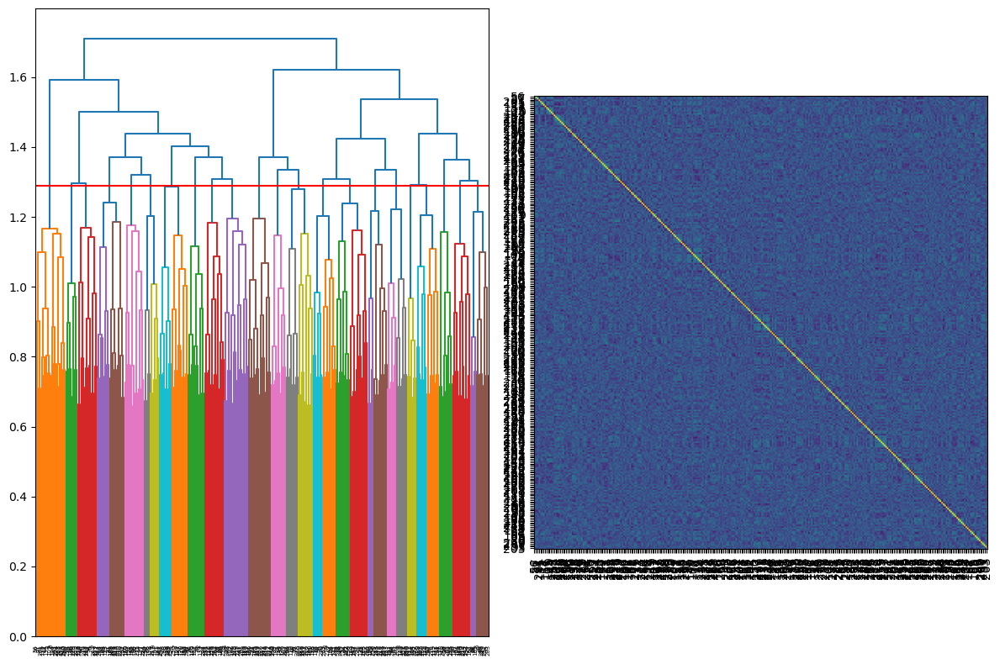

In [32]:
from scipy.stats import spearmanr
from sklearn.metrics import accuracy_score
from scipy.cluster import hierarchy
from scipy.spatial.distance import squareform
from scipy.stats import spearmanr
from collections import defaultdict
# Hierarchical Clustering for Multicollinearity Handling
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 8))
corr = spearmanr(X).correlation
corr = (corr + corr.T) / 2
np.fill_diagonal(corr, 1)
distance_matrix = 1 - np.abs(corr)
dist_linkage = hierarchy.ward(squareform(distance_matrix))
dendro = hierarchy.dendrogram(dist_linkage, labels=np.arange(0, len(X[0])), ax=ax1, leaf_rotation=90)
dendro_idx = np.arange(0, len(dendro["ivl"]))

ax2.imshow(corr[dendro["leaves"], :][:, dendro["leaves"]])
ax2.set_xticks(dendro_idx)
ax2.set_yticks(dendro_idx)
ax2.set_xticklabels(dendro["ivl"], rotation="vertical")
ax2.set_yticklabels(dendro["ivl"])
ax1.axhline(1.29, color='red')
_ = fig.tight_layout()

In [33]:
# Feature Selection from Clustering
scores = []
for i in np.arange(0, 2, 0.01):
    cluster_ids = hierarchy.fcluster(dist_linkage, i, criterion="distance")
    cluster_id_to_feature_ids = defaultdict(list)
    for idx, cluster_id in enumerate(cluster_ids):
        cluster_id_to_feature_ids[cluster_id].append(idx)
    selected_features = [v[0] for v in cluster_id_to_feature_ids.values()]
    selected_features_names = X[:,selected_features]
    
    X_train_sel = X_train[:, selected_features]
    X_test_sel = X_test[:, selected_features]

    clf_sel =  SVC(kernel='sigmoid')
    clf_sel.fit(X_train_sel, y_train)
    y_pred = clf_sel.predict(X_test_sel)
    ba_score = balanced_accuracy_score(y_test, y_pred)
    # print("Baseline accuracy on test data with features removed:", f"{ba_score:.2}")
    scores.append(ba_score)

In [34]:
# Objective function J(T) = w1 * Acc(T) + w2 * T
def objective(T, w1=1, w2=0.01):
    return w1 * scores[T] + w2 * np.arange(0, 2, 0.01)[T]

# Grid search for the best threshold
def find_best_threshold(w1=1, w2=0.01, num_thresholds=200, step_size=0.01):
    thresholds = np.arange(num_thresholds)
    obj_scores = [objective(T, w1, w2) for T in thresholds]
    
    # Find the threshold that maximizes the objective function
    best_threshold = thresholds[np.argmax(obj_scores)]
    best_score = np.max(obj_scores)
    
    return best_threshold, best_score

# Example usage
best_threshold, best_score = find_best_threshold(w1=1, w2=0.01)
best_thersh_val = np.arange(0, 2, 0.01)[best_threshold]
np.arange(0, 2, 0.01)[best_threshold], scores[best_threshold], best_score

(np.float64(1.29), np.float64(1.0), np.float64(1.0129))

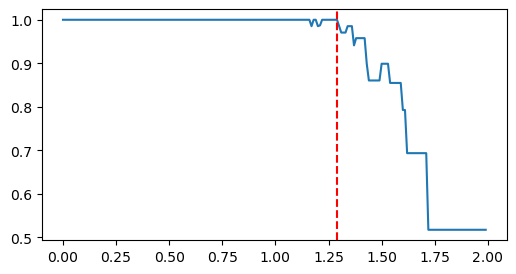

In [35]:
fig, ax = plt.subplots(figsize = (6, 3))
ax.plot(np.arange(0, 2, 0.01), scores,)
ax.axvline(best_thersh_val, color='red', linestyle='--')

In [36]:
cluster_ids = hierarchy.fcluster(dist_linkage, best_thersh_val, criterion="distance")
cluster_id_to_feature_ids = defaultdict(list)
for idx, cluster_id in enumerate(cluster_ids):
    cluster_id_to_feature_ids[cluster_id].append(idx)
selected_features = [v[0] for v in cluster_id_to_feature_ids.values()]
selected_features_names = X[:,selected_features]

X_train_sel = X_train[:, selected_features]
X_test_sel = X_test[:, selected_features]

clf_sel =  SVC(kernel='sigmoid')
clf_sel.fit(X_train_sel, y_train)
y_pred = clf_sel.predict(X_test_sel)
ba_score = balanced_accuracy_score(y_test, y_pred)
# print("Baseline accuracy on test data with features removed:", f"{ba_score:.2}")

Baseline accuracy on test data with features removed: 1.0

Permutation Feature Importance:
    Feature  Importance       Std
1         2    0.028767  0.015798
18       45    0.017260  0.012795
15       29    0.012877  0.003253
7         8    0.012603  0.011243
4         5    0.011781  0.011300
2         3    0.010411  0.010089
9        11    0.009863  0.007269
19       46    0.006301  0.006827
13       22    0.005479  0.007749
6         7    0.003014  0.005675
14       23    0.002466  0.005263
0         0    0.002192  0.005022
3         4    0.001370  0.004110
17       44    0.001096  0.003716
8         9    0.000822  0.003253
20       50    0.000274  0.001918
5         6    0.000000  0.000000
10       15    0.000000  0.000000
12       17    0.000000  0.000000
11       16    0.000000  0.000000
16       33    0.000000  0.000000
21       69    0.000000  0.000000


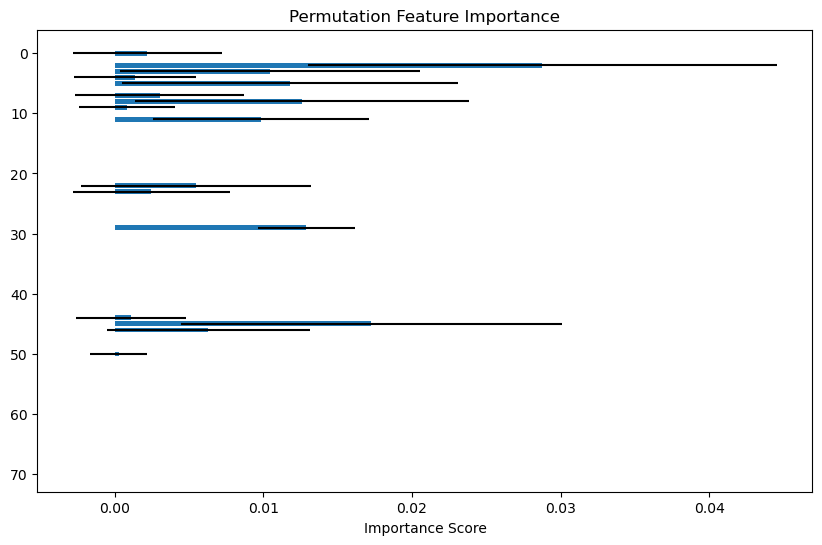

In [37]:
from sklearn.inspection import permutation_importance
clf_sel =  SVC(kernel='sigmoid')
clf_sel.fit(X_train_sel, y_train)
print("Baseline accuracy on test data with features removed:", f"{clf_sel.score(X_test_sel, y_test):.2}")

# Permutation Importance
perm_importance = permutation_importance(clf_sel, X_test_sel, y_test, n_repeats=50, random_state=42, scoring='accuracy')
importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': perm_importance.importances_mean,
    'Std': perm_importance.importances_std
}).sort_values(by='Importance', ascending=False)

print("\nPermutation Feature Importance:")
print(importance_df)

# Visualizing Results
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], xerr=importance_df['Std'])
plt.xlabel("Importance Score")
plt.title("Permutation Feature Importance")
plt.gca().invert_yaxis()
plt.show()


In [38]:
mask = importance_df.reset_index().sort_values('index')['Importance'] > 0
#remove features of poor importance
selected_again = np.array(selected_features)[mask]

In [39]:
# 30 seems like a good number of edges
X = select_edges(150) #take top 35 and bottom 35 strongest

balanced_acc = []
confusion_mat = []
for i in range(500):    
    #balance the dataset through oversampling
    sme = SMOTEENN(random_state=random_states[i]) #random_state=82
    X_res, y_res = sme.fit_resample(X, handedness_class)
    
    # Split into a train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, random_state=random_states[i]) # random_state=0

    X_train_sel = X_train[:, selected_again]
    X_test_sel = X_test[:, selected_again]
    
    #create an SVM Model
    clf =  SVC(kernel='sigmoid')
    clf.fit(X_train_sel, y_train)
    
    y_pred = clf.predict(X_test_sel)

    confusion_mat.append(confusion_matrix(y_test, y_pred))
    balanced_acc.append(balanced_accuracy_score(y_test, y_pred))
    
    # print(confusion_matrix(y_test, y_pred))
    # print(balanced_accuracy_score(y_test, y_pred))

In [40]:
#find the average
confusion_mat = np.array(confusion_mat)
balanced_acc = np.array(balanced_acc)

print(np.mean(balanced_acc))
print(np.mean(confusion_mat, axis=0))

0.9766858344063681
[[38.1    0.442]
 [ 1.236 33.488]]


In [41]:
selected_again

array([ 0,  2,  3,  4,  5,  7,  8,  9, 11, 22, 23, 29, 44, 45, 46, 50])

<Figure size 500x500 with 0 Axes>

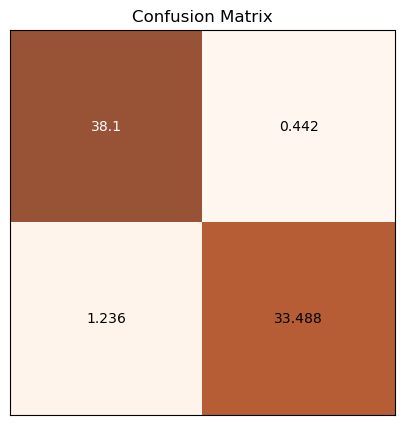

In [42]:
plt.figure(figsize=(5,5))
conf_matrix = np.mean(confusion_mat, axis=0)

fig, ax = plt.subplots(figsize=(5,5))
cax = ax.imshow(conf_matrix, cmap="Oranges", alpha=0.8)
# Add labels
plt.title("Confusion Matrix")

# Remove tick marks
ax.set_xticks([])
ax.set_yticks([])

# Add text annotations
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        if i == 0 and j == 0:
            ax.text(j, i, conf_matrix[i, j], ha='center', va='center', color="white")
        else:
            ax.text(j, i, conf_matrix[i, j], ha='center', va='center', color="black")
fig.savefig('img/matched_confusion_m.png', dpi = 300)

In [43]:
#translating selected features to labels and edges
num=150
indx = [list(i) for i in sorted_keys[:num] + sorted_keys[-num:]]
indx = np.array(indx).T
selected_features
sel_indx = indx[:, selected_again].T

print(sel_indx)
# print('Labels: ', [(labels[i], labels[j]) for i,j in sel_indx])

[[224 256]
 [136 258]
 [148 164]
 [ 35 264]
 [ 88 290]
 [ 88 191]
 [  2 119]
 [ 16 272]
 [ 25 261]
 [ 10 101]
 [ 97 114]
 [  8  24]
 [195 290]
 [ 23 172]
 [126 290]
 [ 58  63]]


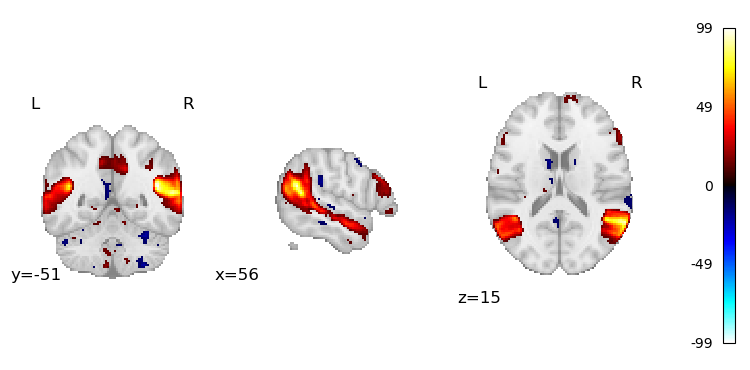

In [188]:
# plot atlas, one region
idx = 50 # first region
atlas_region = image.index_img(atlas, idx)
plotting.plot_stat_map(
    atlas_region, draw_cross=False
)
plt.savefig('report/random_d300_region.png', dpi=300)

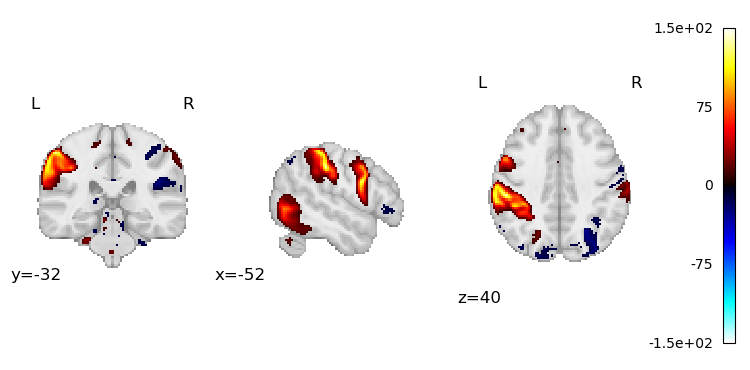

In [194]:
# plot atlas, one region
idx = 23 # first region
atlas_region = image.index_img(atlas, idx)
plotting.plot_stat_map(
    atlas_region, draw_cross=False
)
plt.savefig('report/mostsig_matched_r21.png')

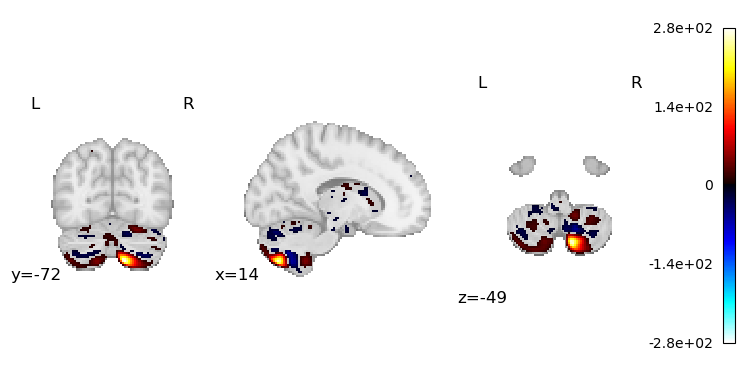

In [195]:
# plot atlas, one region
idx = 172 # first region
atlas_region = image.index_img(atlas, idx)
plotting.plot_stat_map(
    atlas_region, draw_cross=False
)
plt.savefig('report/mostsig_matched_r22.png')

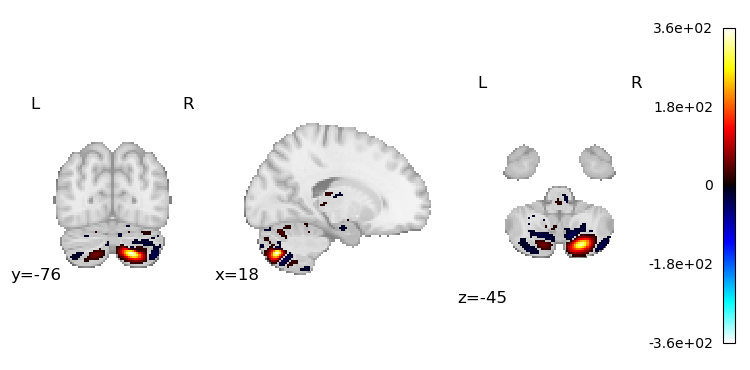

In [192]:
# plot atlas, one region
idx = 136 # first region
atlas_region = image.index_img(atlas, idx)
plotting.plot_stat_map(
    atlas_region, draw_cross=False
)
plt.savefig('report/mostsig_matched_r11.png')

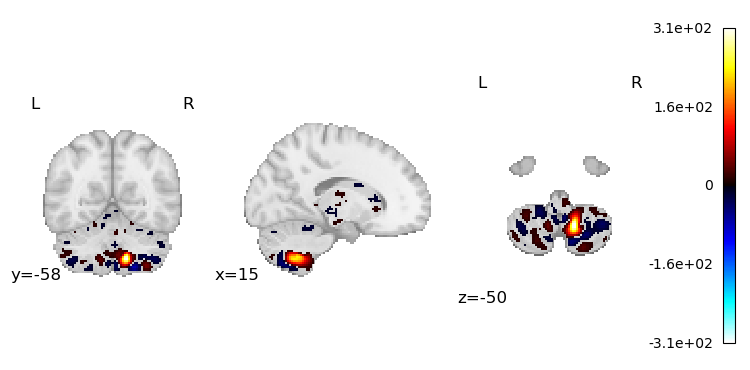

In [193]:
# plot atlas, one region
idx = 258 # first region
atlas_region = image.index_img(atlas, idx)
plotting.plot_stat_map(
    atlas_region, draw_cross=False
)
plt.savefig('report/mostsig_matched_r12.png')

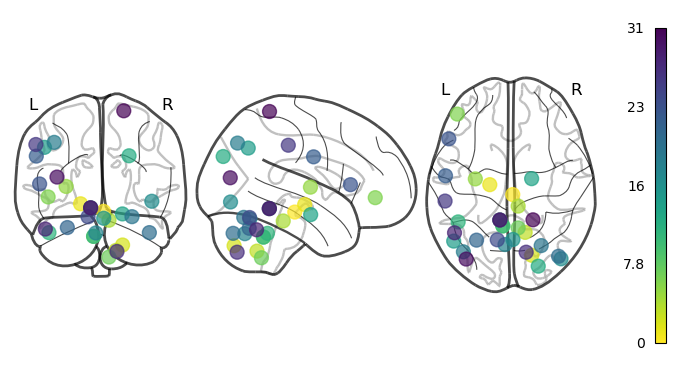

In [197]:
# Let's say you want to plot only certain indices (e.g., regions with indices 0, 1, and 5)
selected_indices = indx[:, cluster_id_to_feature_ids[18]].T.flatten()

# Filter the atlas coordinates to get only the selected regions
filtered_coords = atlas_coords[sel_indx.flatten()]

# Plot only the filtered coordinates
plotting.plot_markers(
    node_values=np.arange(len(filtered_coords)),  # Example values, adjust if necessary
    node_coords=filtered_coords,  # Pass the filtered coordinates
)
plt.savefig('report/used_regions_centroids_matched.png')

In [124]:
any(np.isin(cluster_id_to_feature_ids[2], sel_indx.flatten()))

True

In [181]:
for i in range(22):
    if any(np.isin(cluster_id_to_feature_ids[i], [45])):
        print(i)
        break

18


In [182]:
indx[:, cluster_id_to_feature_ids[18]].T#.flatten()

array([[ 23, 172],
       [133, 193],
       [254, 277],
       [101, 265],
       [ 61,  70],
       [144, 250]])

In [119]:
np.save('SVC_acc_matched.npy', balanced_acc)

In [132]:
## Plot boundaries

from sklearn import svm
from sklearn.inspection import DecisionBoundaryDisplay
import matplotlib.patches as mpatches


def plot_training_data_with_decision_boundary(
    kernel, ax=None, long_title=True, support_vectors=True
):
    indx = [list(i) for i in sorted_keys[:50] + sorted_keys[-50:]]
    indx = np.array(indx).T
    # extract correlation of highest correlated region for every subject
    X = fisher_z_matrices[:, indx[0][[0, -1]], indx[1][[0, -1]]] #6, 8 works well
    # X = select_edges(1)
    # Train the SVC
    sme = SMOTEENN(random_state=82) #random_state=82
    X_res, y_res = sme.fit_resample(X, handedness_class)
    
    # Split into a train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X_res, y_res) # random_state=0
    
    #create an SVM Model
    clf =  SVC(kernel=kernel)
    clf.fit(X_train, y_train)

    # Settings for plotting
    if ax is None:
        _, ax = plt.subplots(figsize=(8, 6))
    x_min, x_max, y_min, y_max = -0.1, 0.1, -0.1, 0.1
    ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))

    # Plot decision boundary and margins
    common_params = {"estimator": clf, "X": X_train, "ax": ax}
    DecisionBoundaryDisplay.from_estimator(
        **common_params,
        response_method="predict",
        plot_method="pcolormesh",
        alpha=0.3,
    )
    DecisionBoundaryDisplay.from_estimator(
        **common_params,
        response_method="decision_function",
        plot_method="contour",
        levels=[-1, 0, 1],
        colors=["k", "k", "k"],
        linestyles=["--", "-", "--"],
    )

    if support_vectors:
        # Plot bigger circles around samples that serve as support vectors
        ax.scatter(
            clf.support_vectors_[:, 0],
            clf.support_vectors_[:, 1],
            s=150,
            facecolors="none",
            edgecolors="k",
        )

    # Plot samples by color and add legend
    # ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, s=30, edgecolors="k")
    scatter = ax.scatter(X_train[:, 0], X_train[:, 1], s=30, c=y_train, edgecolors="k")
    # Get legend elements with correct colors
    handles, _ = scatter.legend_elements(prop="colors", alpha=1)
    
    # Assign correct labels
    handles[0].set_label("Left")
    handles[1].set_label("Right")
    
    ax.legend(handles=handles, loc="upper right", title="Classes")
    # ax.legend(loc="upper right", title="Classes")
    if long_title:
        ax.set_title(f" Decision boundaries of {kernel} kernel in SVC")
    else:
        ax.set_title(kernel)

    if ax is None:
        plt.show()
    plt.savefig('sigmoid_boundary_ica.png', dpi=300, bbox_inches="tight")

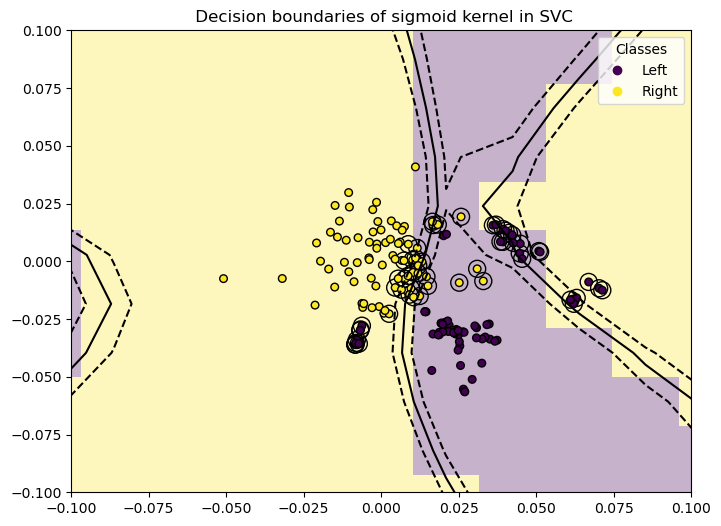

In [133]:
plot_training_data_with_decision_boundary('sigmoid')

## Classification with KNN

In [45]:
from sklearn.neighbors import KNeighborsClassifier

acc_arr = []

X = select_edges(40)
for edge in np.arange(5, 70, 5):
    for k in np.arange(1, 11):
        for i in range(100):
            X = select_edges(edge)
            #balance the dataset through oversampling
            sme = SMOTEENN(random_state=random_states[i]) #random_state=40
            X_res, y_res = sme.fit_resample(X, handedness_class)
            
            # Split into a train and test sets
            X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, random_state=random_states[i]) #random_state=0
            
            #create an SVM Model
            neigh = KNeighborsClassifier(n_neighbors=k)
            neigh.fit(X_train, y_train)
            
            y_pred = neigh.predict(X_test)
            
            point = [edge*2, k, balanced_accuracy_score(y_test, y_pred)]
            acc_arr.append(point)
    print(point)
#balanced_acc.append(point)

[np.int64(5), np.int64(10), np.float64(0.984375)]
[np.int64(10), np.int64(10), np.float64(1.0)]
[np.int64(15), np.int64(10), np.float64(1.0)]
[np.int64(20), np.int64(10), np.float64(1.0)]
[np.int64(25), np.int64(10), np.float64(0.986842105263158)]
[np.int64(30), np.int64(10), np.float64(0.9861111111111112)]
[np.int64(35), np.int64(10), np.float64(0.9861111111111112)]
[np.int64(40), np.int64(10), np.float64(0.96875)]
[np.int64(45), np.int64(10), np.float64(0.9852941176470589)]
[np.int64(50), np.int64(10), np.float64(0.9861111111111112)]
[np.int64(55), np.int64(10), np.float64(1.0)]
[np.int64(60), np.int64(10), np.float64(1.0)]
[np.int64(65), np.int64(10), np.float64(0.984375)]


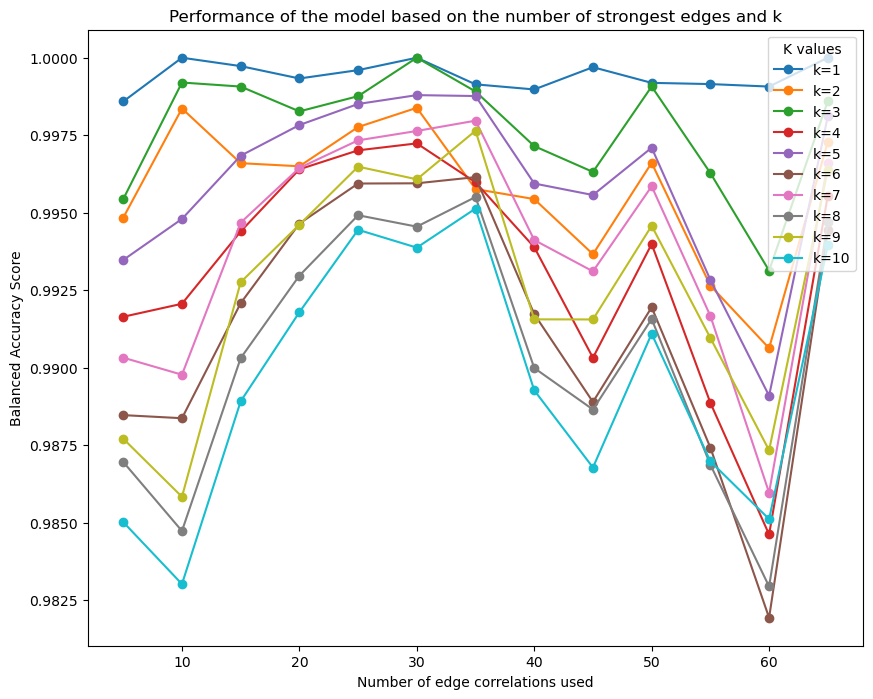

In [46]:
acc_arr = np.array(acc_arr)
acc_df = pd.DataFrame(acc_arr, columns=['edge', 'k', 'acc'])
acc_grouped = acc_df.groupby(['edge', 'k']).mean().reset_index()
acc_grouped['k'] = c=acc_grouped['k'].astype(int)
fig, ax = plt.subplots(figsize = (10, 8))

unique_k = acc_grouped['k'].unique()

# Plot a line for each k
for k in unique_k:
    subset = acc_grouped[acc_grouped['k'] == k].sort_values(by='edge')  # Sort by edges
    ax.plot(subset['edge'], subset['acc'], label=f'k={k}', marker='o', linestyle='-')

# Add legend
ax.legend(title="K values", loc="upper right")

# Titles and labels
ax.set_title('Performance of the model based on the number of strongest edges and k')
ax.set_xlabel('Number of edge correlations used')
ax.set_ylabel('Balanced Accuracy Score')

plt.show()

In [61]:
#finding best parameters where k > 1
idx = acc_grouped[acc_grouped['k'] > 1.0].to_numpy()[:,2].argmax()
acc_grouped[acc_grouped['k'] > 1.0].iloc[idx]

edge    30.0
k        3.0
acc      1.0
Name: 52, dtype: float64

In [121]:
acc_arr = []
edge = 30
k = 3
for i in range(100):
        X = select_edges(edge)
        #balance the dataset through oversampling
        sme = SMOTEENN(random_state=random_states[i]) #random_state=40
        X_res, y_res = sme.fit_resample(X, handedness_class)
        
        # Split into a train and test sets
        X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, random_state=random_states[i]) #random_state=0
        
        #create an SVM Model
        neigh = KNeighborsClassifier(n_neighbors=k)
        neigh.fit(X_train, y_train)
        
        y_pred = neigh.predict(X_test)
        
        point = [edge, k, balanced_accuracy_score(y_test, y_pred)]
        acc_arr.append(point)
print(point)

[30, 3, np.float64(1.0)]


In [122]:
#find the average
acc_arr = np.array(acc_arr)

print(np.mean(acc_arr[:, 2]))

1.0


In [123]:
np.save('matched_data_knn.npy', acc_arr)

## Regression

Spectral Embedding doesn't work so we can not build a regression

In [134]:
baseline= mean_squared_error([handedness.mean()]*len(handedness), handedness)
baseline

1600.6023875114786

In [70]:
num=40

X = select_edges(num)

#using nearesst neighbors as the distance function
embedding = SpectralEmbedding(n_components=1)
X_transformed = embedding.fit_transform(X)
# X_transformed.shape

#fit a linear model to transformed data
coefficients = np.polyfit(X_transformed.flatten(), handedness, 1)
polynomial = np.poly1d(coefficients)
y_regression = polynomial(X_transformed.flatten())

print(f'MSE: {mean_squared_error(y_regression, handedness)}')

MSE: 1047.0360037206315


Text(0.5, 1.0, 'Regression of Handedness')

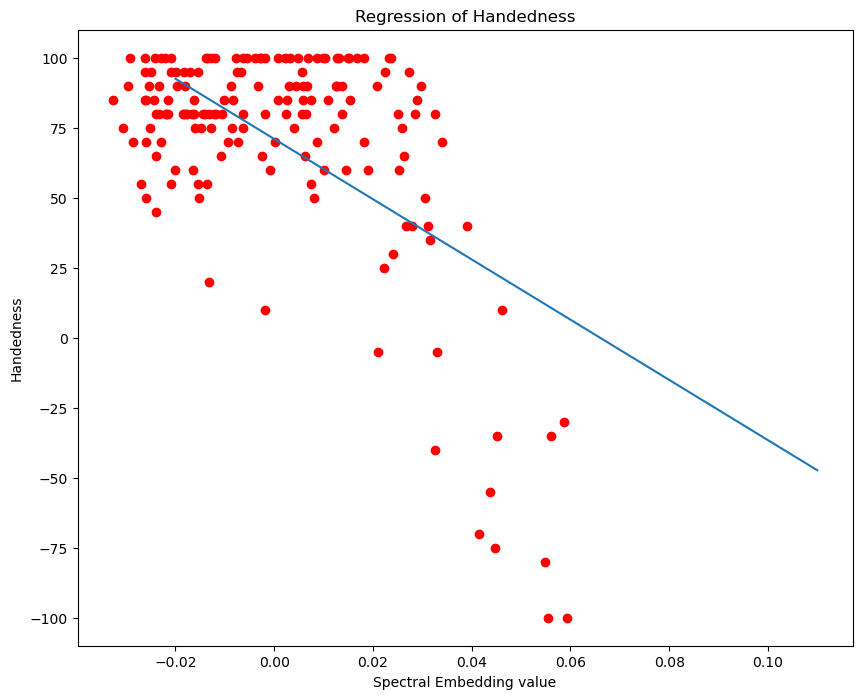

In [71]:
fig, ax = plt.subplots(figsize = (10, 8))
ax.scatter(X_transformed.flatten(), handedness, color='r')
ax.plot(np.arange(-0.02, 0.12, 0.01), polynomial(np.arange(-0.02, 0.12, 0.01)))
plt.xlabel('Spectral Embedding value')
plt.ylabel('Handedness')
ax.set_title('Regression of Handedness')

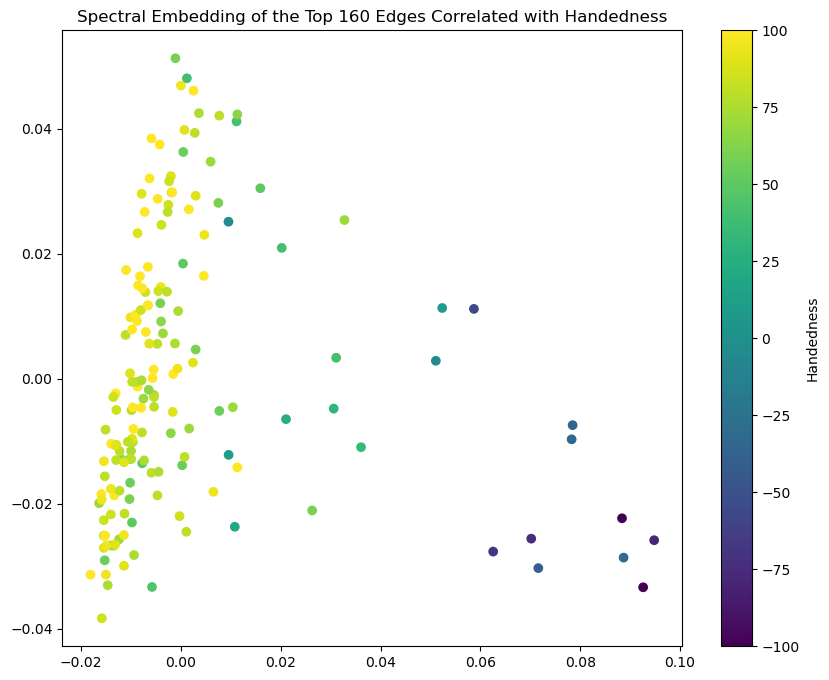

In [72]:
num=80
X = select_edges(num)
#using nearesst neighbors as the distance function
embedding = SpectralEmbedding(n_components=2)
X_transformed = embedding.fit_transform(X)
# X_transformed.shape
plot_spectral_embedding(X_transformed)

## Using PCA on Spectral Embeding Reduced to 2 dimensions

In [73]:
pca = PCA(n_components=1)
X_train, X_test, y_train, y_test = train_test_split(X_transformed, handedness, test_size=0.10, random_state=15) #test size is small is we have limited data
pca

PCA(n_components=1)

In [74]:
#fit and train the data
pca_train = pca.fit_transform(X_train)

#fit a linear model to the transformed data
coefficients = np.polyfit(pca_train.flatten(), y_train, 1)
polynomial = np.poly1d(coefficients)
y_regression = polynomial(pca_train)

#pca test
pca_test = pca.transform(X_test)
y_regression_test = polynomial(pca_test)

print(f'Train set MSE: {mean_squared_error(y_regression, y_train)}')
print(f'Test set MSE: {mean_squared_error(y_regression_test, y_test)}')

Train set MSE: 293.6507763440848
Test set MSE: 506.22938146616843


Text(0.5, 1.0, 'Regression of Handedness')

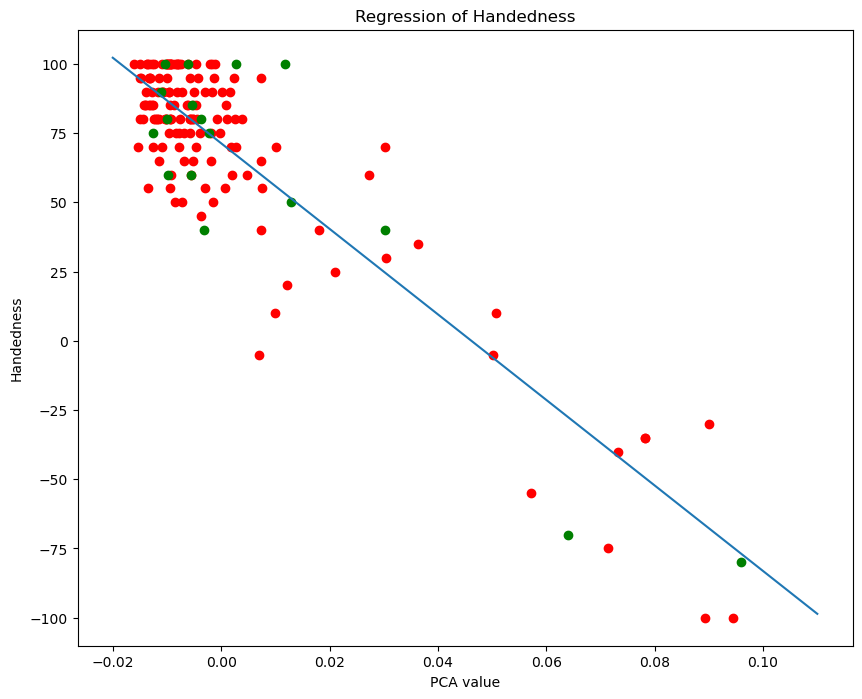

In [75]:
fig, ax = plt.subplots(figsize = (10, 8))
ax.scatter(pca_train.flatten(), y_train, color='r')
ax.plot(np.arange(-0.02, 0.12, 0.01), polynomial(np.arange(-0.02, 0.12, 0.01)))
ax.scatter(pca_test.flatten(), y_test, color='g')
plt.xlabel('PCA value')
plt.ylabel('Handedness')
ax.set_title('Regression of Handedness')

In [76]:
nums = np.arange(5, 55, 5)
train_mse = []
test_mse = []
for num in nums:
    #changed back to 100 for speed
    for i in range(100):
        X = select_edges(num)
        #using nearesst neighbors as the distance function
        embedding = SpectralEmbedding(n_components=2)
        X_transformed = embedding.fit_transform(X)
        pca = PCA(n_components=1)
        X_train, X_test, y_train, y_test = train_test_split(X_transformed, handedness, test_size=0.10, random_state=random_states[i]) #test size is small is we have limited data

        #fit and train the data
        pca_train = pca.fit_transform(X_train)
        
        #fit a linear model to the transformed data
        coefficients = np.polyfit(pca_train.flatten(), y_train, 1)
        polynomial = np.poly1d(coefficients)
        y_regression = polynomial(pca_train)
        
        #pca test
        pca_test = pca.transform(X_test)
        y_regression_test = polynomial(pca_test)
        
        train_mse.append([num, mean_squared_error(y_regression, y_train)])
        test_mse.append([num, mean_squared_error(y_regression_test, y_test)])

In [85]:
train_mse_dct = {}
test_mse_dct = {}
for i,j in train_mse:
    if i not in train_mse_dct:
        train_mse_dct[i] = 0
    train_mse_dct[i] += j

for i,j in test_mse:
    if i not in test_mse_dct:
        test_mse_dct[i] = 0
    test_mse_dct[i] += j

for i in train_mse_dct:
    train_mse_dct[i] = train_mse_dct[i]/100

for i in test_mse_dct:
    test_mse_dct[i] = test_mse_dct[i]/100

train_mse_mean = list(train_mse_dct.items())
test_mse_mean = list(test_mse_dct.items())

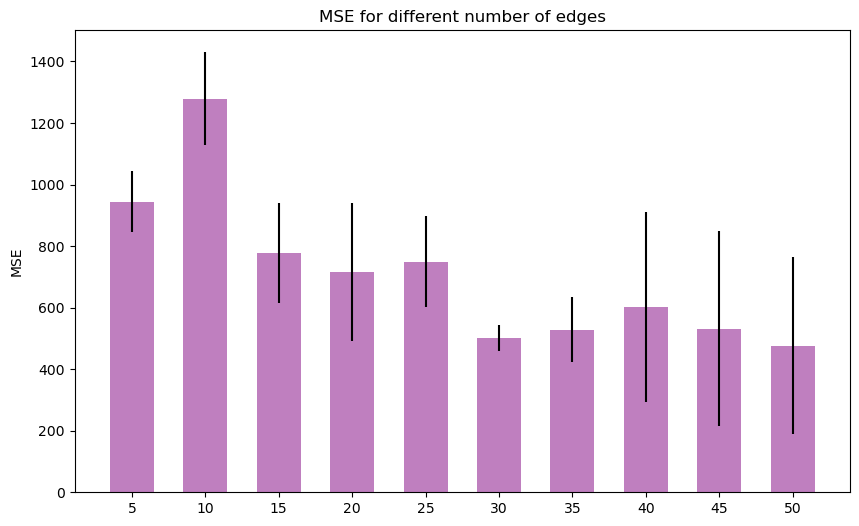

In [86]:

# Provided data
data = train_mse

# Convert to DataFrame
results = pd.DataFrame(data, columns=["Edges_Num", "MSE"])

# Group by year and compute mean & standard deviation
grouped = results.groupby("Edges_Num")["MSE"]
mean_values = grouped.mean()
std_values = grouped.std()

# Plotting
fig, ax = plt.subplots(figsize = (10, 6))
colors = ["purple"] #red", "green", "blue"
plt.bar(mean_values.index, mean_values, yerr=std_values, align='center', alpha=0.5, color=colors[:len(mean_values)], width=3)

plt.xticks(mean_values.index)
plt.ylabel("MSE")
plt.title("MSE for different number of edges")
plt.show()

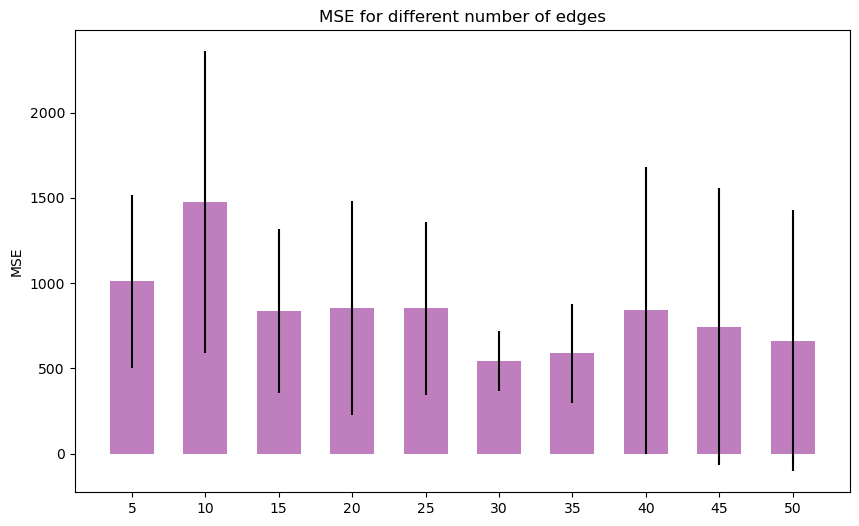

In [87]:
# Provided data
data = test_mse

# Convert to DataFrame
df = pd.DataFrame(data, columns=["Edges_Num", "MSE"])

# Group by year and compute mean & standard deviation
grouped = df.groupby("Edges_Num")["MSE"]
mean_values = grouped.mean()
std_values = grouped.std()

# Plotting
fig, ax = plt.subplots(figsize = (10, 6))
colors = ["purple"] #red", "green", "blue"
plt.bar(mean_values.index, mean_values, yerr=std_values, align='center', alpha=0.5, color=colors[:len(mean_values)], width=3)

plt.xticks(mean_values.index)
plt.ylabel("MSE")
plt.title("MSE for different number of edges")
plt.show()

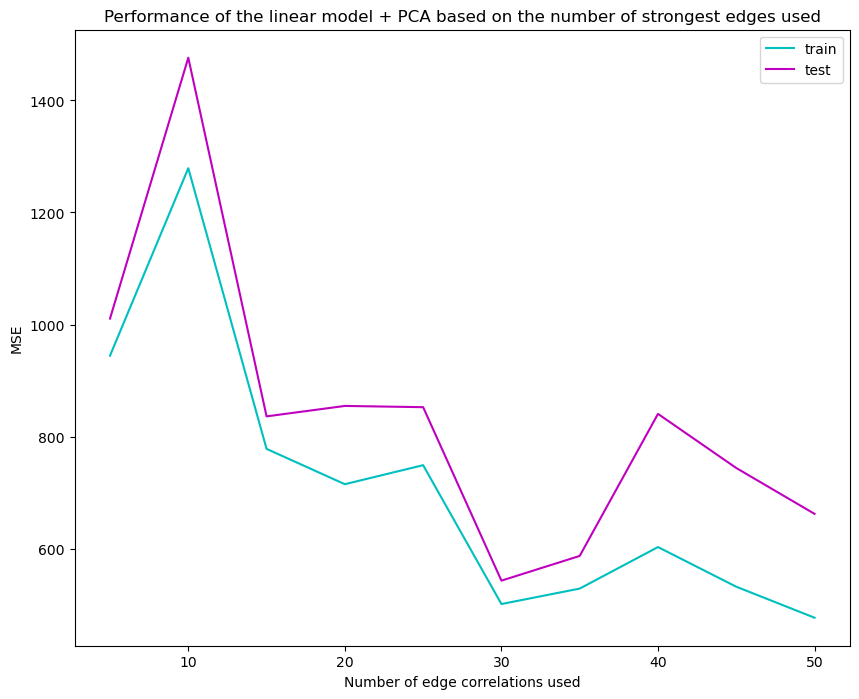

In [88]:
train_mse_mean = np.array(train_mse_mean) # Balanced Accuracy is the average of recall obtained on each class
test_mse_mean = np.array(test_mse_mean) 

fig, ax = plt.subplots(figsize = (10, 8))

#create scatter plot
ax.plot(train_mse_mean[:, 0], train_mse_mean[:, 1], color='c', label='train')
ax.plot(test_mse_mean[:, 0], test_mse_mean[:, 1], color='m', label='test')

ax.set_title(f'Performance of the linear model + PCA based on the number of strongest edges used')

plt.xlabel('Number of edge correlations used')
plt.ylabel('MSE')
plt.legend()

plt.show()


In [89]:
idx = test_mse_mean[:, 1].argmin()
test_mse_mean[idx] #30 top and 30 bottom

array([ 30.        , 543.06530908])

In [93]:
test_mse = np.array(test_mse)
best_mse = test_mse[test_mse[:,0] == 30]

In [95]:
np.save('embed_reg_matched.npy', best_mse)

## Regression with KNNRegressor

In [124]:
from sklearn.neighbors import KNeighborsRegressor

acc_arr = []
for edge in np.arange(5, 70, 5):
    for k in np.arange(1, 11):
        for i in range(100):
            X = select_edges(edge)
            neigh = KNeighborsRegressor(n_neighbors=k)
            X_train, X_test, y_train, y_test = train_test_split(X, handedness, test_size=0.10)
            neigh.fit(X_train, y_train)
            y_pred = neigh.predict(X_test)
            
            point = [edge, k, mean_squared_error(y_pred, y_test)]
            acc_arr.append(point)
    print(point)

[np.int64(5), np.int64(10), 666.5882352941177]
[np.int64(10), np.int64(10), 529.2941176470588]
[np.int64(15), np.int64(10), 759.25]
[np.int64(20), np.int64(10), 516.4558823529412]
[np.int64(25), np.int64(10), 1732.0882352941176]
[np.int64(30), np.int64(10), 1892.4264705882354]
[np.int64(35), np.int64(10), 262.8529411764706]
[np.int64(40), np.int64(10), 436.04411764705884]
[np.int64(45), np.int64(10), 215.16176470588235]
[np.int64(50), np.int64(10), 538.9411764705883]
[np.int64(55), np.int64(10), 1097.3529411764705]
[np.int64(60), np.int64(10), 458.7647058823529]
[np.int64(65), np.int64(10), 478.36764705882354]


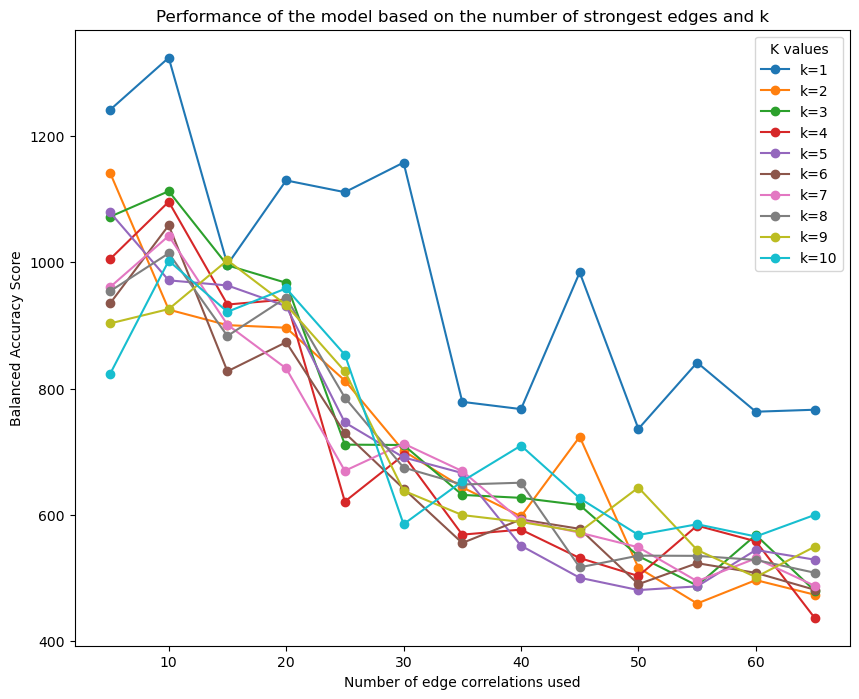

In [125]:
acc_arr = np.array(acc_arr)
acc_df = pd.DataFrame(acc_arr, columns=['edge', 'k', 'acc'])
acc_grouped = acc_df.groupby(['edge', 'k']).mean().reset_index()
acc_grouped['k'] = c=acc_grouped['k'].astype(int)
fig, ax = plt.subplots(figsize = (10, 8))

unique_k = acc_grouped['k'].unique()

# Plot a line for each k
for k in unique_k:
    subset = acc_grouped[acc_grouped['k'] == k].sort_values(by='edge')  # Sort by edges
    ax.plot(subset['edge'], subset['acc'], label=f'k={k}', marker='o', linestyle='-')

# Add legend
ax.legend(title="K values", loc="upper right")

# Titles and labels
ax.set_title('Performance of the model based on the number of strongest edges and k')
ax.set_xlabel('Number of edge correlations used')
ax.set_ylabel('Balanced Accuracy Score')

plt.show()

In [128]:
idx = acc_grouped[acc_grouped['k'] > 1].to_numpy()[:, 2].argmin()
acc_grouped[acc_grouped['k'] > 1].iloc[idx]

edge     65.000000
k         4.000000
acc     437.221507
Name: 123, dtype: float64

In [129]:
best_mse_knnr = acc_df[(acc_df['edge'] == 65) & (acc_df['k'] == 4)]['acc'].to_numpy()

In [130]:
np.save('knn_reg_matched.npy', best_mse_knnr)

# Unnecessary

In [197]:
import numpy as np

def create_symmetric_gaussian_matrix(size, mean=0.00243, std_dev=0.044):
    """
    Creates a symmetric square matrix of Gaussian noise with ones on the diagonal.
    
    Parameters:
    size (int): The size of the matrix (e.g., 5 for a 5x5 matrix).
    mean (float): The mean of the Gaussian distribution (default is 0).
    std_dev (float): The standard deviation of the Gaussian distribution (default is 1).
    
    Returns:
    np.ndarray: A symmetric matrix with Gaussian noise and ones on the diagonal.
    """
    # Generate a random matrix of Gaussian noise (lower triangular part)
    matrix = np.random.normal(loc=mean, scale=std_dev, size=(size, size))
    
    # Make the matrix symmetric by averaging with its transpose
    matrix = np.tril(matrix) + np.tril(matrix, -1).T
    
    # Set ones on the diagonal
    np.fill_diagonal(matrix, 1)
    
    return matrix

In [19]:
def generate_random_sequence(size, low=0, high=718):
    np.random.seed(10)
    return np.random.randint(low, high, size)

In [199]:
fake_data = []
for i in range(172):
    fake_mat = create_symmetric_gaussian_matrix(718)
    fake_data.append(fake_mat)
fake_data = np.array(fake_data)

In [169]:
#correlation_matrix[np.isnan(correlation_matrix)] = 1.0

In [239]:
def correlate(fake_data, rand_sample, handedness):
    forced_mat = []
    for i, mat in enumerate(fake_data):
        score = handedness[i]
        weight_score = np.array(weight_function(np.arange(0, 718), score))
        weight_score[rand_sample] = 1
        
        W = np.diag(weight_score)
        mat = np.matmul(W, fake_data[i])
        # mat[mat >= 1.0] = 0.99 
        # z_trans = np.arctanh(mat)
        forced_mat.append(mat)
        if i%10 == 0:
            print(i)
    return np.array(forced_mat)

In [ ]:
weight_score = np.array(weight_function(np.arange(0, 718), score))

## using current handedness

1.0
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170


/tmp/ipykernel_416/3245410976.py:8: RuntimeWarning: invalid value encountered in arctanh
  z_forced_mat = np.arctanh(forced_mat)


8454


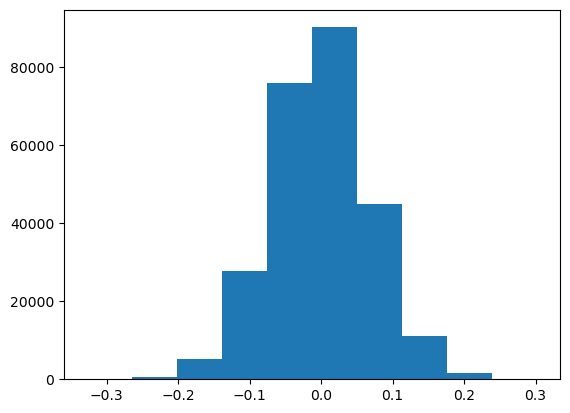

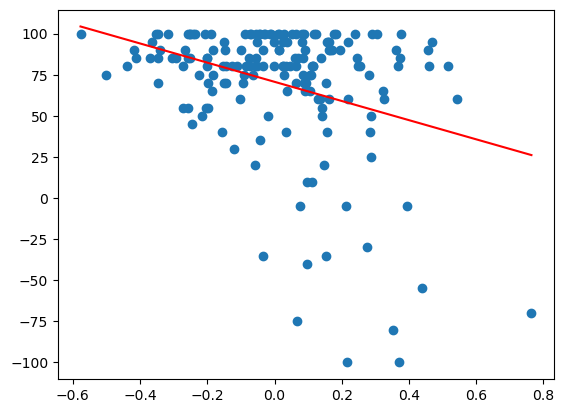

0.775
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
7411


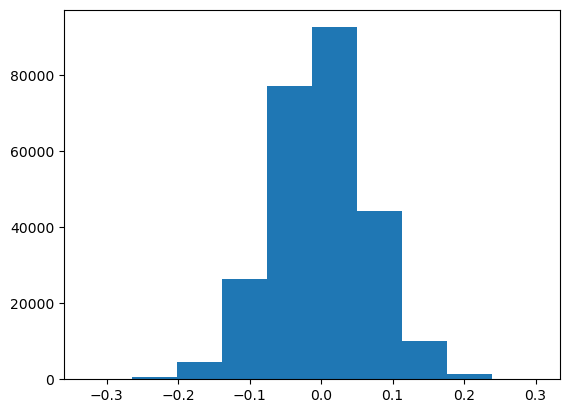

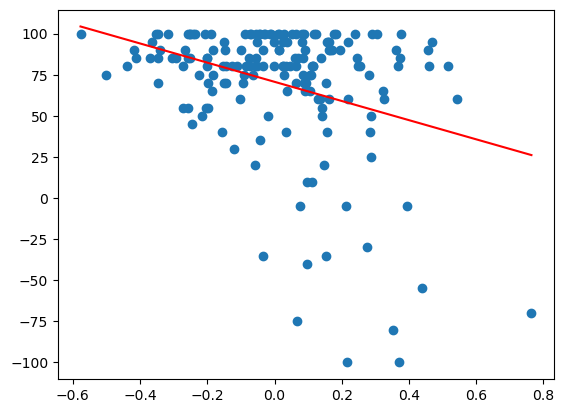

0.55
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
6053


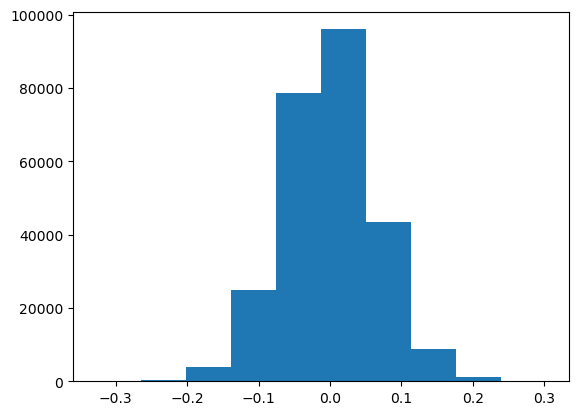

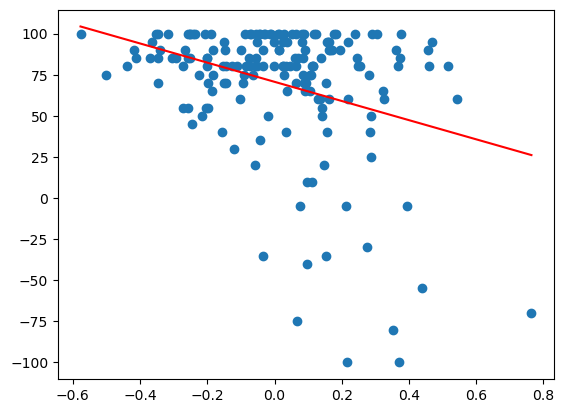

0.32499999999999996
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
4490


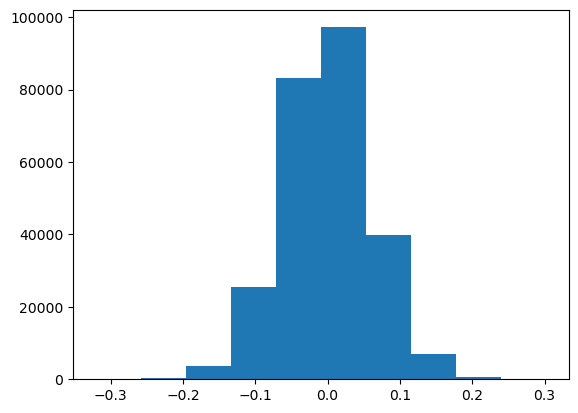

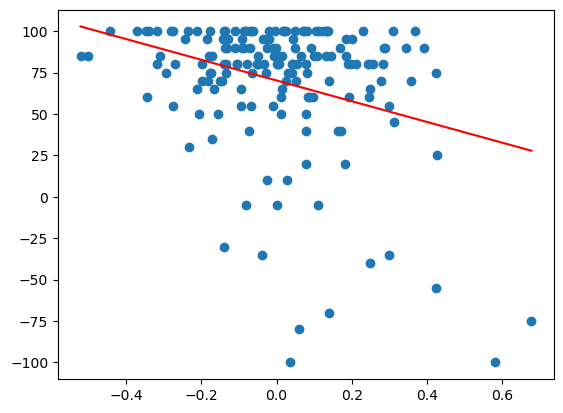

0.1
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
2429


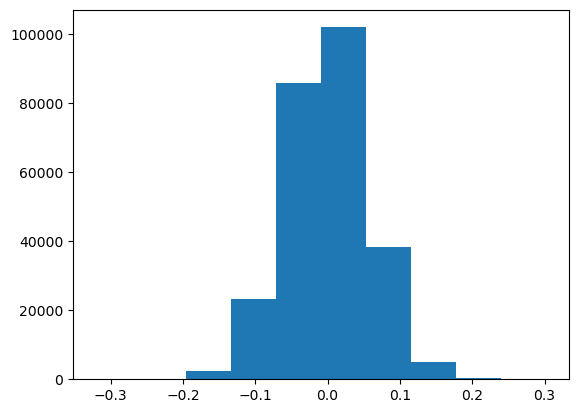

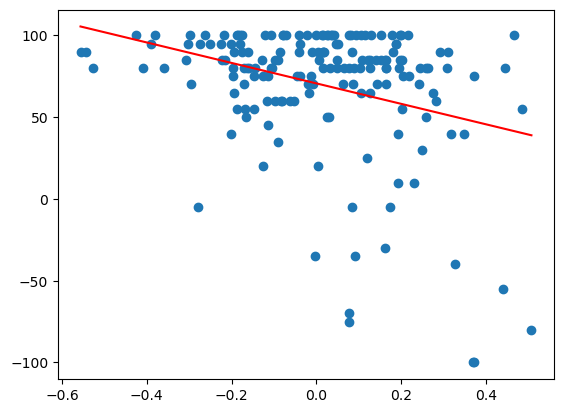

In [26]:
splits = np.linspace(1, 0.1, 5)
means = []
for i in splits:
    print(i)
    rand_sample = generate_random_sequence(int(718*i))
    forced_mat = correlate(fake_data, rand_sample)
    forced_mat[forced_mat == 1.0] = np.nan
    z_forced_mat = np.arctanh(forced_mat)
    corr_mat, pval_mat = sig_pvals(z_forced_mat)
    corr_sig = np.array(list(corr_mat.values()))
    plt.hist(corr_sig)
    bottom_5, top_5 = np.percentile(corr_sig, [1, 99])
    plt.axvline(bottom_5, color='red')
    plt.axvline(top_5, color = 'red')
    plt.show()
    linear_plot(corr_mat, z_forced_mat, handedness, order=0)

In [ ]:
# using balanced handedness

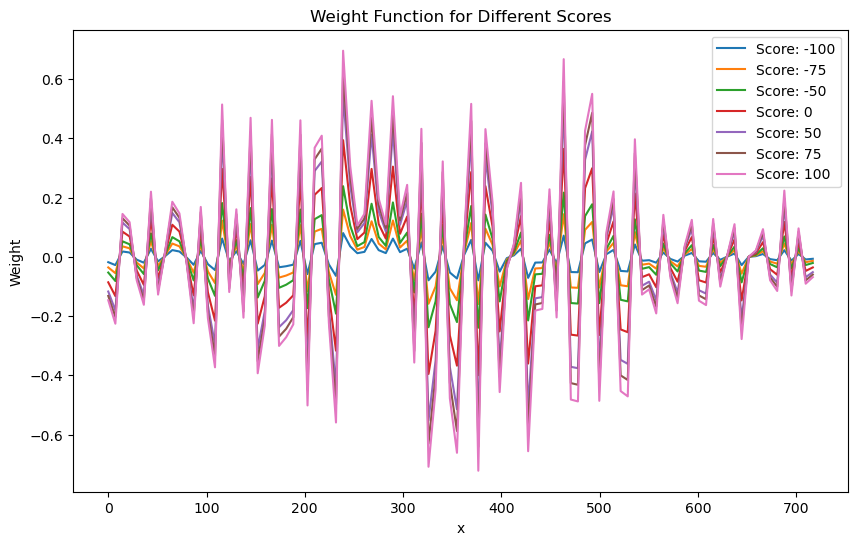

In [301]:
import numpy as np
import matplotlib.pyplot as plt

def weight_function(x, score, amp_0=0.1, f1=1.9, s1=3, f2=6, s2=5, f3=4.5, s3=1.3, w=250, b0=350, c=0.1, alpha=0.8, exp_damp=0.1):
    """
    Generates weights correlated with a score (-100 to 100)
    """
    
    # Compute b as a function of score
    b = b0 + c * score
    
    # Compute amp as a function of score
    amp = amp_0 * (1 + alpha * score / 100)
    
    # Sinusoidal component with dampened exponent to prevent overflow
    sinusoidal = (f1 * np.sin(s1 * x) + f2 * np.sin(s2 * np.exp(exp_damp * x)) + f3 * np.sin(s3 * np.pi * x))
    
    # Gaussian component
    gaussian = (1 / np.sqrt(2 * np.pi)) * np.exp(-0.5 * ((x - b) / w) ** 2)
    
    # Final weight function
    return amp * sinusoidal * gaussian

# Example usage
x_values = np.linspace(0, 717, 100)
scores = [-100, -75, -50, 0, 50, 75, 100]  # Example scores

plt.figure(figsize=(10, 6))
for score in scores:
    weights = weight_function(x_values, score)
    plt.plot(x_values, weights, label=f'Score: {score}')

plt.xlabel('x')
plt.ylabel('Weight')
plt.legend()
plt.title('Weight Function for Different Scores')
plt.show()


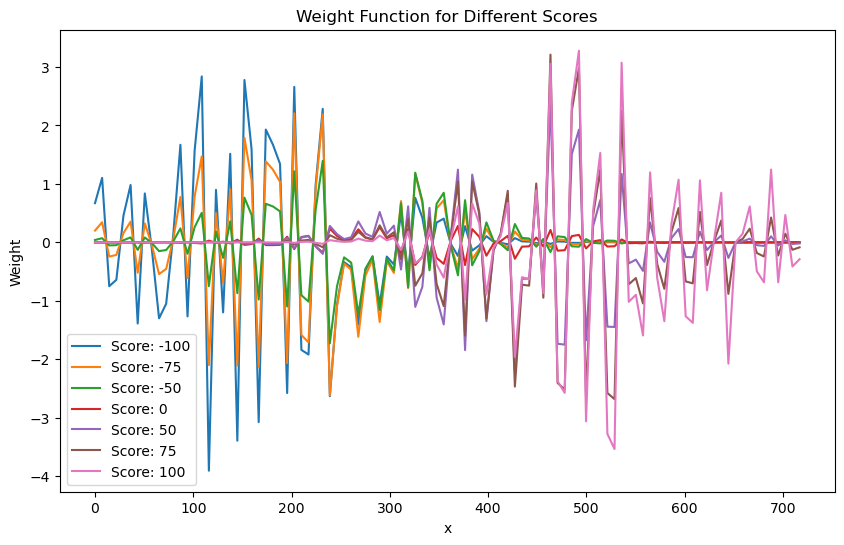

In [287]:
def weight_function(x, score, amp_0=0.1, f1=1.9, s1=3, f2=6, s2=5, f3=4.5, s3=1.3, w=100, b0=350, c=2, alpha=1, exp_damp=0.1):
    """
    Generates weights correlated with a score (-100 to 100)
    """
    
    # Compute b as a function of score
    b = b0 + c * score
    
    # Compute amp as a function of score
    amp = amp_0 * (1 + alpha * score / 10)
    
    # Sinusoidal component with dampened exponent to prevent overflow
    sinusoidal = (f1 * np.sin(s1 * x) + f2 * np.sin(s2 * np.exp(exp_damp * x)) + f3 * np.sin(s3 * np.pi * x))
    
    # Gaussian component
    gaussian = (1 / np.sqrt(2 * np.pi)) * np.exp(-0.5 * ((x - b) / w) ** 2)
    
    # Final weight function
    return amp * sinusoidal * gaussian

# Example usage
x_values = np.linspace(0, 717, 100)
scores = [-100, -75, -50, 0, 50, 75, 100]  # Example scores

plt.figure(figsize=(10, 6))
for score in scores:
    weights = weight_function(x_values, score)
    plt.plot(x_values, weights, label=f'Score: {score}')

plt.xlabel('x')
plt.ylabel('Weight')
plt.legend()
plt.title('Weight Function for Different Scores')
plt.show()

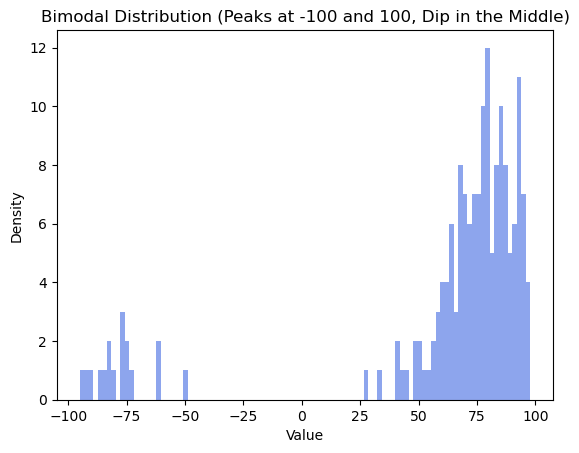

In [307]:
from scipy.stats import beta

def generate_bimodal_beta(size=2000, a=5, b=5):
    """
    Generates a bimodal distribution with two peaks at -100 and 100 using Beta distributions.
    
    Parameters:
    - size: Total number of samples.
    - a, b: Shape parameters for the Beta distribution (adjusts peak sharpness).
    
    Returns:
    - A NumPy array containing the generated bimodal distribution.
    """
    # Generate from Beta(2,5) and flip one to the negative side
    size_a = int(size * 0.1)
    size_b = size - size_a
    left_peak = -100 + 100 * beta.rvs(a, b, size=size_a)  # Shifted to -100
    right_peak = 100 - 100 * beta.rvs(a, b, size=size_b)  # Shifted to 100

    # Combine
    bimodal_data = np.hstack([left_peak, right_peak])
    
    return bimodal_data

# Generate data
size = 172
bimodal_data = generate_bimodal_beta(size, a=2, b=7)

# Plot histogram
plt.hist(bimodal_data, bins=100, density=False, alpha=0.6, color='royalblue')
plt.title("Bimodal Distribution (Peaks at -100 and 100, Dip in the Middle)")
plt.xlabel("Value")
plt.ylabel("Density")
plt.show()

In [308]:
fake_data = np.array(fake_data)

0.1
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
13035


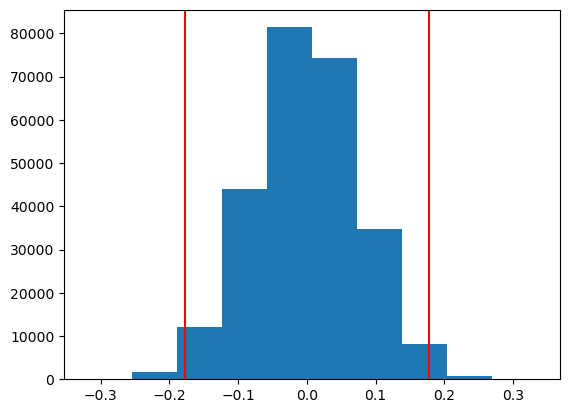

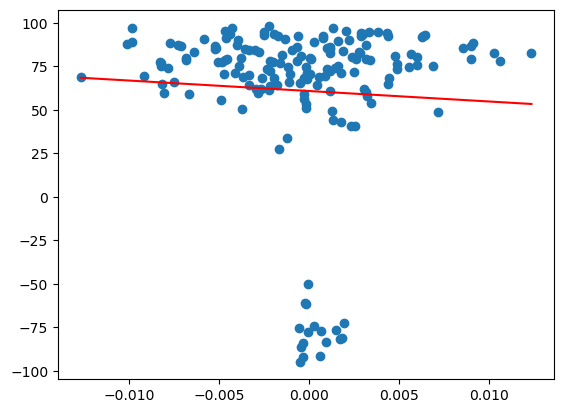

0.325
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170


KeyboardInterrupt: 

In [309]:
splits = np.linspace(0.1, 1, 5)
means = []
for i in splits:
    print(i)
    rand_sample = generate_random_sequence(int(718*i))
    forced_mat = correlate(fake_data, rand_sample, bimodal_data)
    forced_mat[forced_mat >= 1.0] = np.nan
    # z_forced_mat = np.arctanh(forced_mat)
    corr_mat, pval_mat = sig_pvals(forced_mat)
    corr_sig = np.array(list(corr_mat.values()))
    plt.hist(corr_sig)
    bottom_5, top_5 = np.percentile(corr_sig, [1, 99])
    plt.axvline(bottom_5, color='red')
    plt.axvline(top_5, color = 'red')
    plt.show()
    linear_plot(corr_mat, forced_mat, bimodal_data, order=0)

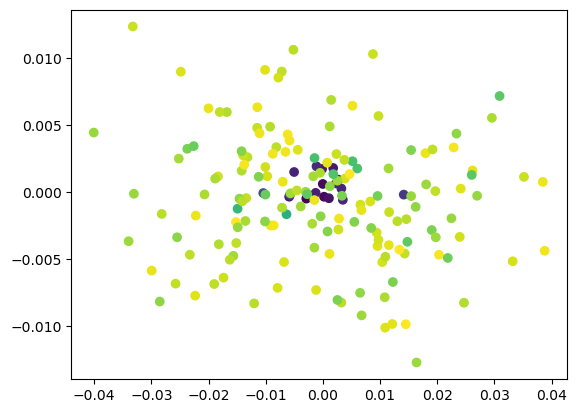

In [310]:
lst = sorted(corr_mat, key=lambda x: corr_mat[x])
corr_mat[lst[0]]
corr_mat[lst[-1]]
plt.scatter(forced_mat[:, lst[-1][0], lst[-1][1]], forced_mat[:, lst[0][0], lst[0][1]], c=bimodal_data)

In [33]:
def linear_plot(corr_mat, z_forced_mat, handedness, order=0):
    sorted_keys = sorted(corr_mat, key=lambda x: corr_mat[x])
    
    coefficients = np.polyfit(z_forced_mat[:, sorted_keys[order][0], sorted_keys[order][1]],  handedness, 1)
    polynomial = np.poly1d(coefficients)
    y_regression = polynomial(np.sort(z_forced_mat[:, sorted_keys[order][0], sorted_keys[order][1]]))
    
    plt.plot(np.sort(z_forced_mat[:, sorted_keys[order][0], sorted_keys[order][1]]), y_regression, color='red')
    
    plt.scatter(z_forced_mat[:, sorted_keys[order][0], sorted_keys[order][1]],  handedness)
    plt.show()

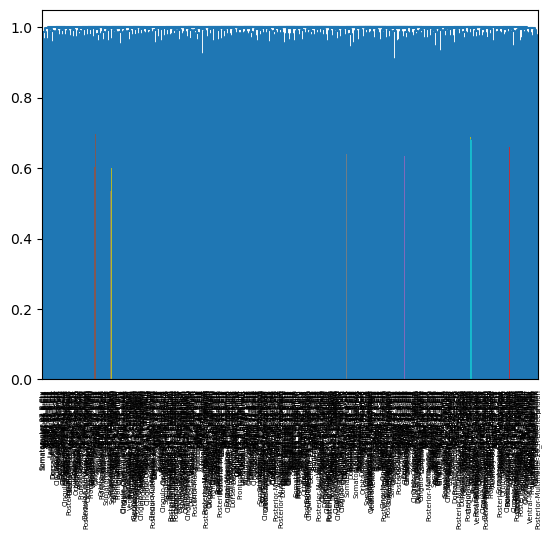

In [123]:
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from scipy.spatial.distance import squareform 

# Assuming 'corr_matrix' is your pre-calculated correlation matrix 
# Convert correlation matrix to a distance matrix (1 - correlation)
distance_matrix = 1 - np.abs(sym_m) 

# Perform hierarchical clustering using 'complete' linkage
Z = linkage(squareform(distance_matrix), method='complete') 

# Plot the dendrogram 
dendrogram(Z, labels=list(hcp.ca_parcels['labels'].values())[1:], leaf_rotation=90) 

clusters = fcluster(Z, 12, criterion='maxclust', depth=2, R=None, monocrit=None)

In [129]:
cluster_dct = {}
for i, j in zip(clusters, list(hcp.ca_parcels['labels'].values())[1:]):
    if i not in cluster_dct:
        cluster_dct[i] = []
    cluster_dct[i].append(j)

In [135]:
cluster_dct[10]

[np.str_('Visual2-29_L-Ctx'),
 np.str_('Visual2-30_L-Ctx'),
 np.str_('Visual2-34_L-Ctx'),
 np.str_('Visual2-35_L-Ctx'),
 np.str_('Visual2-36_L-Ctx'),
 np.str_('Visual2-38_L-Ctx'),
 np.str_('Visual2-41_L-Ctx'),
 np.str_('Somatomotor-34_L-Ctx'),
 np.str_('Cingulo-Opercular-43_L-Ctx'),
 np.str_('Somatomotor-35_L-Ctx'),
 np.str_('Somatomotor-36_L-Ctx'),
 np.str_('Cingulo-Opercular-48_L-Ctx'),
 np.str_('Visual2-51_L-Ctx'),
 np.str_('Default-73_L-Ctx'),
 np.str_('Visual2-02_R-Ctx'),
 np.str_('Visual2-03_R-Ctx'),
 np.str_('Visual2-04_R-Ctx'),
 np.str_('Visual2-05_R-Ctx'),
 np.str_('Visual2-06_R-Ctx'),
 np.str_('Visual2-07_R-Ctx'),
 np.str_('Visual2-11_R-Ctx'),
 np.str_('Visual2-14_R-Ctx'),
 np.str_('Somatomotor-14_R-Ctx'),
 np.str_('Cingulo-Opercular-16_R-Ctx'),
 np.str_('Somatomotor-15_R-Ctx'),
 np.str_('Somatomotor-16_R-Ctx'),
 np.str_('Cingulo-Opercular-19_R-Ctx'),
 np.str_('Cingulo-Opercular-20_R-Ctx'),
 np.str_('Cingulo-Opercular-21_R-Ctx'),
 np.str_('Cingulo-Opercular-22_R-Ctx'),
 np.st

In [73]:
1 - np.abs(np.round(correlation_matrix[0], 3)) 

array([[0.   , 0.977, 0.936, ..., 0.996, 0.989, 0.988],
       [0.977, 0.   , 0.972, ..., 0.967, 0.978, 0.998],
       [0.936, 0.972, 0.   , ..., 0.992, 0.987, 0.99 ],
       ...,
       [0.996, 0.967, 0.992, ..., 0.   , 0.988, 0.994],
       [0.989, 0.978, 0.987, ..., 0.988, 0.   , 0.972],
       [0.988, 0.998, 0.99 , ..., 0.994, 0.972, 0.   ]],
      shape=(718, 718), dtype=float32)

In [77]:
np.triu(correlation_matrix[0])

array([[ 1.        ,  0.02270541,  0.06385531, ..., -0.00370855,
        -0.01087578, -0.01174463],
       [ 0.        ,  1.        ,  0.02763665, ...,  0.03280056,
         0.021624  ,  0.00245521],
       [ 0.        ,  0.        ,  1.        , ...,  0.00840014,
        -0.01308579, -0.0100534 ],
       ...,
       [ 0.        ,  0.        ,  0.        , ...,  1.        ,
         0.01174293, -0.00579708],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         1.        ,  0.0278465 ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  1.        ]], shape=(718, 718), dtype=float32)

In [78]:
def make_symmetric(upper_tri):
    """
    Given the upper triangular part of a correlation matrix, reconstruct the full symmetric matrix.

    Parameters:
    - upper_tri: (n, n) NumPy array with the upper triangle filled, lower part can be zeros.

    Returns:
    - A symmetric (n, n) correlation matrix.
    """
    symmetric_matrix = upper_tri + upper_tri.T - np.diag(np.diag(upper_tri))  # Reflect upper to lower
    np.fill_diagonal(symmetric_matrix, 1)  # Ensure diagonal is 1
    return symmetric_matrix

In [80]:
sym_m = make_symmetric(np.triu(correlation_matrix[0]))

In [89]:
len(hcp.ca_parcels['labels'])

719

In [104]:
import hcp_utils as hcp
hcp.view_parcellation(hcp.mesh.inflated, hcp.ca_parcels)#.savefig('img1.png')

In [136]:
hcp.view_parcellation(hcp.mesh.inflated, hcp.mmp)

In [111]:
hcp.ca_network#['map_all']

{'ids': array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
 'map_all': array([9, 3, 6, ..., 7, 7, 7], shape=(91282,)),
 'labels': {np.int64(0): np.str_(''),
  np.int64(1): np.str_('Visual1'),
  np.int64(2): np.str_('Visual2'),
  np.int64(3): np.str_('Somatomotor'),
  np.int64(4): np.str_('Cingulo-Opercular'),
  np.int64(5): np.str_('Dorsal-attention'),
  np.int64(6): np.str_('Language'),
  np.int64(7): np.str_('Frontoparietal'),
  np.int64(8): np.str_('Auditory'),
  np.int64(9): np.str_('Default'),
  np.int64(10): np.str_('Posterior-Multimodal'),
  np.int64(11): np.str_('Ventral-Multimodal'),
  np.int64(12): np.str_('Orbito-Affective')},
 'rgba': {np.int64(0): array([1., 1., 1., 0.]),
  np.int64(1): array([0., 0., 1., 1.]),
  np.int64(2): array([0.392157, 0.      , 1.      , 1.      ]),
  np.int64(3): array([0., 1., 1., 1.]),
  np.int64(4): array([0.6, 0. , 0.6, 1. ]),
  np.int64(5): array([0., 1., 0., 1.]),
  np.int64(6): array([0.      , 0.603922, 0.603922, 1.      ]),
  np

In [112]:
hcp.ca_parcels

{'ids': array([    0,     1,     2,     3,     4,     5,     6,     7,     8,
            9,    10,    11,    12,    13,    14,    15,    16,    17,
           18,    19,    20,    21,    22,    23,    24,    25,    26,
           27,    28,    29,    30,    31,    32,    33,    34,    35,
           36,    37,    38,    39,    40,    41,    42,    43,    44,
           45,    46,    47,    48,    49,    50,    51,    52,    53,
           54,    55,    56,    57,    58,    59,    60,    61,    62,
           63,    64,    65,    66,    67,    68,    69,    70,    71,
           72,    73,    74,    75,    76,    77,    78,    79,    80,
           81,    82,    83,    84,    85,    86,    87,    88,    89,
           90,    91,    92,    93,    94,    95,    96,    97,    98,
           99,   100,   101,   102,   103,   104,   105,   106,   107,
          108,   109,   110,   111,   112,   113,   114,   115,   116,
          117,   118,   119,   120,   121,   122,   123,   124,   125,

In [120]:
hcp.ca_network#['map_all']

{'ids': array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
 'map_all': array([9, 3, 6, ..., 7, 7, 7], shape=(91282,)),
 'labels': {np.int64(0): np.str_(''),
  np.int64(1): np.str_('Visual1'),
  np.int64(2): np.str_('Visual2'),
  np.int64(3): np.str_('Somatomotor'),
  np.int64(4): np.str_('Cingulo-Opercular'),
  np.int64(5): np.str_('Dorsal-attention'),
  np.int64(6): np.str_('Language'),
  np.int64(7): np.str_('Frontoparietal'),
  np.int64(8): np.str_('Auditory'),
  np.int64(9): np.str_('Default'),
  np.int64(10): np.str_('Posterior-Multimodal'),
  np.int64(11): np.str_('Ventral-Multimodal'),
  np.int64(12): np.str_('Orbito-Affective')},
 'rgba': {np.int64(0): array([1., 1., 1., 0.]),
  np.int64(1): array([0., 0., 1., 1.]),
  np.int64(2): array([0.392157, 0.      , 1.      , 1.      ]),
  np.int64(3): array([0., 1., 1., 1.]),
  np.int64(4): array([0.6, 0. , 0.6, 1. ]),
  np.int64(5): array([0., 1., 0., 1.]),
  np.int64(6): array([0.      , 0.603922, 0.603922, 1.      ]),
  np

In [119]:
len(hcp.ca_parcels['nontrivial_ids'])

718